Léa ZADIKIAN - MARS 2022
# Projet n° 7 : Implémentez un modèle de scoring

* **Objectif** : 
Nous sommes Data Scientist au sein d'une société financière, nommée "Prêt à dépenser", qui propose des crédits à la consommation pour des personnes ayant peu ou pas du tout d'historique de prêt. L’entreprise souhaite mettre en œuvre un outil de “scoring crédit” pour calculer la probabilité qu’un client rembourse son crédit, puis classifie la demande en crédit accordé ou refusé. Elle souhaite donc développer un algorithme de classification en s’appuyant sur des sources de données variées. Prêt à dépenser décide donc de développer un dashboard interactif pour que les chargés de relation client puissent à la fois expliquer de façon la plus transparente possible les décisions d’octroi de crédit, mais également permettre à leurs clients de disposer de leurs informations personnelles et de les explorer facilement.
* **Mission :**
    * Construire un modèle de scoring qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique.
     * Construire un dashboard interactif à destination des gestionnaires de la relation client permettant d'interpréter les prédictions faites par le modèle, et d’améliorer la connaissance client des chargés de relation client.
    * Mettre en production le modèle de scoring de prédiction à l’aide d’une API, ainsi que le dashboard interactif qui appelle l’API pour les prédictions.

**Source de données**  : https://www.kaggle.com/competitions/home-credit-default-risk/data

## Sommaire :
<a href="#C0">Imports et téléchargements </a>

* [Partie 1 : Analyse exploratoire des données](#partie1)
    * [1.1 Tour d'horizon des fichiers de données](#section_1_1)

    * [1.2 Analyse univariée](#section_1_2)
   
    * [1.3 Analyse bivariée](#section_1_3)
  
    
* [Partie 2 : Feature enginnering](#partie2)


* [Partie 3 : Preprocessing](#partie3)
    * [3.1 Imputation des valeurs manquantes](#section_3_1)
 
    * [3.2 Traitement du déséquilibre de classe avec SMOTE](#section_3_2)
* [Partie 4 : Modélisation](#partie4)
    * [4.1 Comparaison des modèles](#section_4_1)
    * [4.1 Feature importance](#section_4_2)

* [Partie 5 : Déploiement](#partie5)
* [Partie 6 : Analyse du Data Drift avec Evidently AI](#partie6)




# <a name="C0">Imports et téléchargements</a>


In [106]:
!pip install mlflow==2.3.2
!pip install virtualenv
!pip install mkl-service
!pip install lightgbm
!pip install imblearn
!pip install xgboost==1.7.5
!pip install utils
!pip install streamlit
!pip install evidently
!pip install missingno

  Using cached xgboost-1.7.5-py3-none-win_amd64.whl (70.9 MB)
  Attempting uninstall: xgboost
    Found existing installation: xgboost 1.7.4
    Uninstalling xgboost-1.7.4:
      Successfully uninstalled xgboost-1.7.4


ERROR: Could not install packages due to an OSError: [WinError 5] Accès refusé: 'C:\\Users\\lea\\anaconda3\\Lib\\site-packages\\~-boost\\lib\\xgboost.dll'
Consider using the `--user` option or check the permissions.



In [108]:
import numpy as np
import pandas as pd
import gc
import time
import re
from contextlib import contextmanager
import missingno as msno

import matplotlib.pyplot as plt
import plotly.graph_objs as go
import plotly.offline as py
import seaborn as sns

# Scikit-learn
from sklearn.impute import KNNImputer
from sklearn.impute import SimpleImputer
from lightgbm import LGBMClassifier
from sklearn import model_selection
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score, roc_curve, accuracy_score,fbeta_score, make_scorer

from sklearn.model_selection import KFold, StratifiedKFold
from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier

import xgboost as xgb
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE

# MLFlow
import mlflow
import mlflow.lightgbm
import mlflow.xgboost
from mlflow import MlflowClient
from mlflow.models.signature import infer_signature
from pprint import pprint

# Evidently
import evidently
from evidently import ColumnMapping
from evidently.report import Report
from evidently.metrics.base_metric import generate_column_metrics
from evidently.metric_preset import DataDriftPreset
from evidently.metrics import *


## Partie 1 :  Analyse exploratoire des données <a class="anchor" id="partie1"></a>
Source de données : https://www.kaggle.com/competitions/home-credit-default-risk/data

Cette première partie d'analyse exploratoire du jeu de données comporte : 
* Un tour d'horizon des différents fichiers du jeu de données.
* Une analyse uni et bi varié ensentiellement sur le fichier princpale qui est "application_train.csv".
* Une analyse des corrélations.

Cette partie permet de comprendre l'ensemble de données fournies, et les relations entre les variables. Elle nous permet aussi d'identifier les opérations de nettoyage et de feature engineering à effectuer par la suite.

### 1.1 Tour d'horizon des fichiers de données <a class="anchor" id="section_1_1"></a>

### HomeCredit_columns_description.csv
Fichier de description des variables des différentes tables.

In [2]:
column_description = pd.read_csv('HomeCredit_columns_description.csv',encoding='ISO-8859-1')
column_description

,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
...,...,...,...,...,...
214,217,installments_payments.csv,NUM_INSTALMENT_NUMBER,On which installment we observe payment,NaN
215,218,installments_payments.csv,DAYS_INSTALMENT,When the installment of previous credit was su...,time only relative to the application
216,219,installments_payments.csv,DAYS_ENTRY_PAYMENT,When was the installments of previous credit p...,time only relative to the application
217,220,installments_payments.csv,AMT_INSTALMENT,What was the prescribed installment amount of ...,NaN


### application_train.csv

In [3]:
app_train_df = pd.read_csv('application_train.csv')
app_train_df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


### application_test.csv

In [4]:
app_test_df = pd.read_csv('application_test.csv')
app_test_df

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
48740,456222,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
48741,456223,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,3.0,1.0
48742,456224,Cash loans,M,N,N,0,225000.0,450000.0,25128.0,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0


### bureau.csv

In [5]:
bureau_df = pd.read_csv('bureau.csv')
bureau_df

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.00,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.00,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.50,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.00,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.00,NaN,NaN,0.0,Consumer credit,-21,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1716423,259355,5057750,Active,currency 1,-44,0,-30.0,NaN,0.0,0,11250.00,11250.0,0.0,0.0,Microloan,-19,NaN
1716424,100044,5057754,Closed,currency 1,-2648,0,-2433.0,-2493.0,5476.5,0,38130.84,0.0,0.0,0.0,Consumer credit,-2493,NaN
1716425,100044,5057762,Closed,currency 1,-1809,0,-1628.0,-970.0,NaN,0,15570.00,NaN,NaN,0.0,Consumer credit,-967,NaN
1716426,246829,5057770,Closed,currency 1,-1878,0,-1513.0,-1513.0,NaN,0,36000.00,0.0,0.0,0.0,Consumer credit,-1508,NaN


### bureau_balance.csv

In [6]:
bureau_balance_df = pd.read_csv('bureau_balance.csv')
bureau_balance_df

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C
...,...,...,...
27299920,5041336,-47,X
27299921,5041336,-48,X
27299922,5041336,-49,X
27299923,5041336,-50,X


Bureau data contains all client's previous credits provided by other financial institutions that were reported to Credit Bureau (for clients who have a loan in the sample). For every loan in the sample, there are as many rows as number of credits the client had in Credit Bureau before the application date. SK_ID_CURR is the key connecting application_train|test data with bureau data.

In [7]:
column_description.loc[column_description['Table']=='bureau_balance.csv', ['Row','Description']]

,Row,Description
139,SK_BUREAU_ID,Recoded ID of Credit Bureau credit (unique cod...
140,MONTHS_BALANCE,Month of balance relative to application date ...
141,STATUS,Status of Credit Bureau loan during the month ...


In [8]:
column_description.loc[column_description['Table']=='bureau_balance.csv'].Description.tolist()

['Recoded ID of Credit Bureau credit (unique coding for each application) - use this to join to CREDIT_BUREAU table ',
 'Month of balance relative to application date (-1 means the freshest balance date)',
 'Status of Credit Bureau loan during the month (active, closed, DPD0-30,\x85 [C means closed, X means status unknown, 0 means no DPD, 1 means maximal did during month between 1-30, 2 means DPD 31-60,\x85 5 means DPD 120+ or sold or written off ] )']

### credit_balance.csv

In [9]:
credit_balance_df = pd.read_csv('credit_card_balance.csv')
credit_balance_df

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840307,1036507,328243,-9,0.000,45000,NaN,0.0,NaN,NaN,0.000,...,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3840308,1714892,347207,-9,0.000,45000,0.0,0.0,0.0,0.0,0.000,...,0.000,0.000,0.0,0,0.0,0.0,23.0,Active,0,0
3840309,1302323,215757,-9,275784.975,585000,270000.0,270000.0,0.0,0.0,2250.000,...,273093.975,273093.975,2.0,2,0.0,0.0,18.0,Active,0,0
3840310,1624872,430337,-10,0.000,450000,NaN,0.0,NaN,NaN,0.000,...,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0


### installments_payments.csv

In [10]:
installments_payments_df = pd.read_csv('installments_payments.csv')
installments_payments_df

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585
...,...,...,...,...,...,...,...,...
13605396,2186857,428057,0.0,66,-1624.0,NaN,67.500,NaN
13605397,1310347,414406,0.0,47,-1539.0,NaN,67.500,NaN
13605398,1308766,402199,0.0,43,-7.0,NaN,43737.435,NaN
13605399,1062206,409297,0.0,43,-1986.0,NaN,67.500,NaN


### previous_application.csv

In [11]:
previous_application_df = pd.read_csv('previous_application.csv')
previous_application_df

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,0.0,267295.5,WEDNESDAY,12,...,Furniture,30.0,low_normal,POS industry with interest,365243.0,-508.0,362.0,-358.0,-351.0,0.0
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,29250.0,87750.0,TUESDAY,15,...,Furniture,12.0,middle,POS industry with interest,365243.0,-1604.0,-1274.0,-1304.0,-1297.0,0.0
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,10525.5,105237.0,MONDAY,12,...,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-1457.0,-1187.0,-1187.0,-1181.0,0.0
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,NaN,180000.0,WEDNESDAY,9,...,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-1155.0,-825.0,-825.0,-817.0,1.0


The dataframe previous_application contains information about all previous applications for Home Credit loans of clients who have loans in the sample. There is one row for each previous application related to loans in our data sample. SK_ID_CURR is the key connecting application_train|test data with previous_application data.

### 1.2 Analyse univariée <a class="anchor" id="section_1_2"></a>
Nous allons réaliser une analyse univariée pour notre fichier principal qui est "application_train.csv", 
   * Statistiques sur les valeurs manquantes.
   * Représentation graphique des distributions :
       * de la target,
       * des variables numériques,
       * des catégorielles.

In [12]:
# Fichier application_train.csv" 
app_train_df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


Le fichier "application_train.csv" représente les demandes de prêt auprès de la société Prêt à dépensser. Il comporte 307.511 lignes, chaque ligne est une demande de crédit d'un client.

Types :SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object
------------------------------------------------------------
          SK_ID_CURR         TARGET   CNT_CHILDREN  AMT_INCOME_TOTAL  \
count  307511.000000  307511.000000  307511.000000      3.075110e+05   
mean   278180.518577       0.080729       0.417052      1.687979e+05   
std    102790.175348       0.272419       0.722121      2.371231e+05   
min    100002.000000       0.000000       0.000000      2.565000e+04   
25%    189145.500000       0.000000       0.000000      1.125000e+05   
50%    278202.000000       0.000000       0.000000     

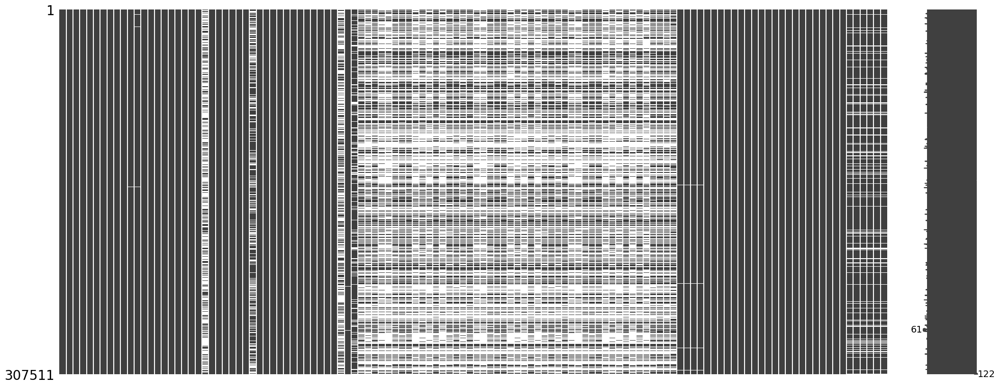

In [13]:
def description_dataset(data, matrix):
    if matrix == True:
        msno.matrix(data)
    print(f'Types :{data.dtypes}')
    print("--" * 30)
    print(data.describe())
    print("--" * 30)
    print("Valeurs manquantes par colonnes ( % ): ")
    print((((data.isna().sum() / data.shape[0]) * 100).round(2)).sort_values(ascending= False))

description_dataset(app_train_df, matrix=True)

#### Statistiques sur les valeurs manquantes

In [14]:
# Function to calculate missing values by column
def missing_values_table(df):
    # Taux de valeurs manquantes :
    print("Taux de valeurs manquantes dans le df avant imputatation :" , round(df.isna().mean().mean(),4))
    # Total valeurs manquantes
    mis_val = df.isnull().sum()
    
    # Pourcentage valeurs manquantes
    mis_val_percent = 100 * df.isnull().sum() / len(df)
    
    # Création d'un df avec les résultats
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
    
    # Renommage des colonnes
    mis_val_table_ren_columns = mis_val_table.rename(columns = {0 : 'Missing Values', 1 : '% of Total Values'})
    
    # Tri du tableau par pourcentage décroissant de valeurs manquantes
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
    
    # Affiche des infos de synthèse
    print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"
           "There are " + str(mis_val_table_ren_columns.shape[0]) +
           " columns that have missing values.")
    
    # Return the dataframe with missing information
    return mis_val_table_ren_columns

#  Statistiques sur les valeurs manquantes :
missing_values = missing_values_table(app_train_df)
missing_values.head(30)

Taux de valeurs manquantes dans le df avant imputatation : 0.244
Your selected dataframe has 122 columns.
There are 67 columns that have missing values.


,Missing Values,% of Total Values
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4
NONLIVINGAPARTMENTS_AVG,213514,69.4
FONDKAPREMONT_MODE,210295,68.4
LIVINGAPARTMENTS_MODE,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_AVG,210199,68.4


In [15]:
# Définition de la TARGET : 
column_description.loc[column_description['Row']=='TARGET'].Description.tolist()

['Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)']

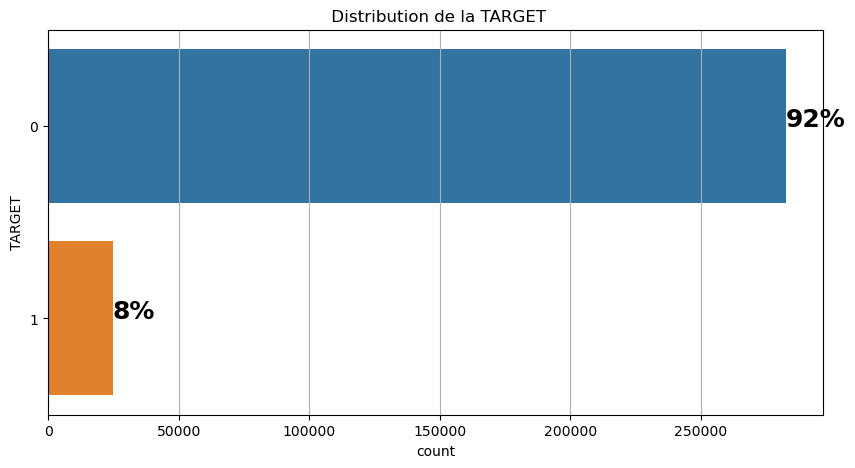

In [16]:
# Représentation de la distribition de la target
ax, fig = plt.subplots(figsize=(10,5)) 
ax = sns.countplot(y='TARGET', data=app_train_df)
ax.set_title(" Distribution de la TARGET")
plt.grid(axis='x')

for p in ax.patches:
        percentage = '{:.0f}%'.format(100 * p.get_width()/len(app_train_df.TARGET))
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y), fontsize=18, fontweight='bold')
        
plt.show()

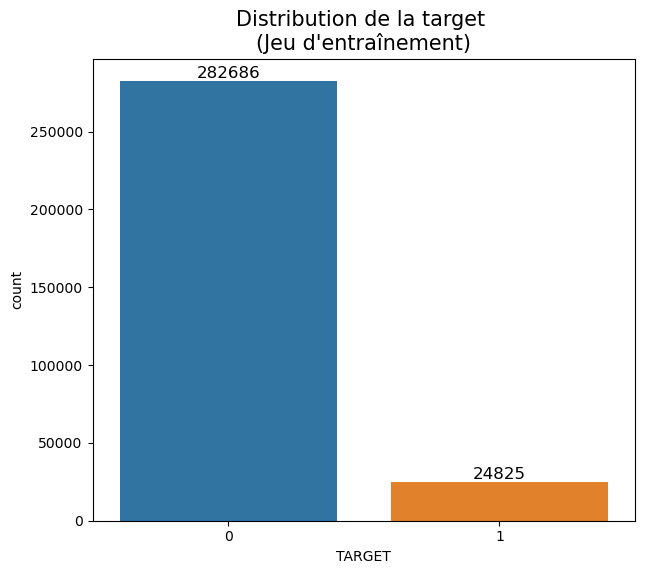

In [17]:
# Représentation de la distribition de la target
fig,ax=plt.subplots(figsize=(7,6))
plt.title("Distribution de la target \n(Jeu d'entraînement)", fontsize=15)
sns.countplot(x='TARGET', data=app_train_df)
for container in ax.containers:
    ax.bar_label(container,size=12,fmt='%.0f')
plt.show()

**Le jeu de données présente un fort déséquilibre de classe au niveau de la target. La target à 1 représente moins de  10 % (8%) des données.**

In [21]:
# Dataframe des variables numériques
numerical_columns_df = app_train_df.select_dtypes(exclude=['object'])
# Dataframe des variables catégorielles
categ_columns_df = app_train_df.select_dtypes(include=['object'])

In [22]:
numerical_columns_df.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


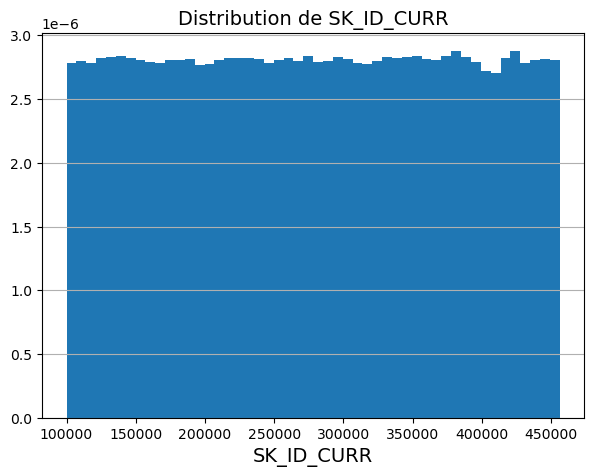

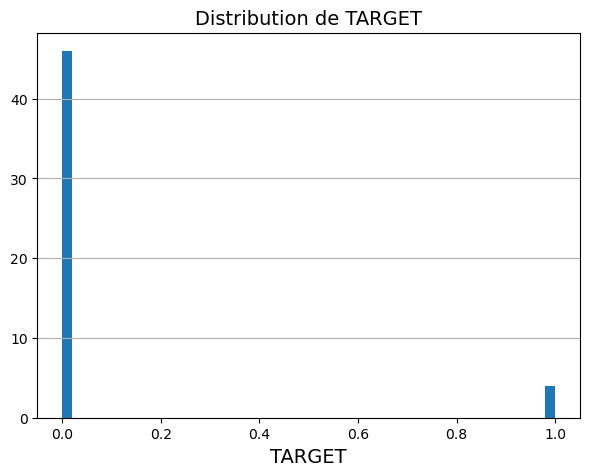

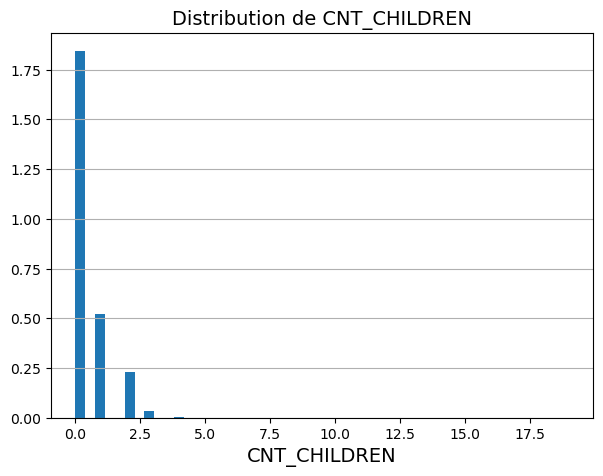

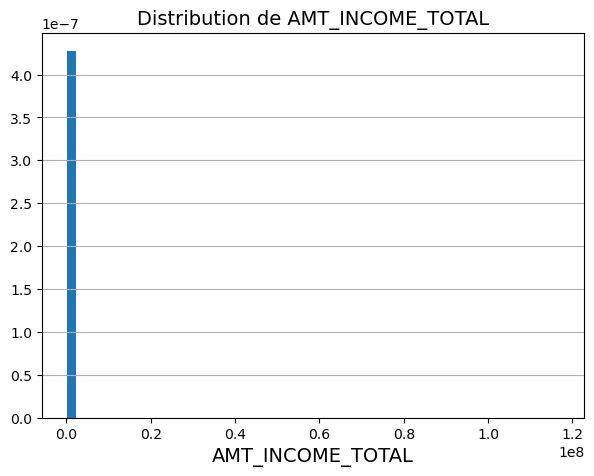

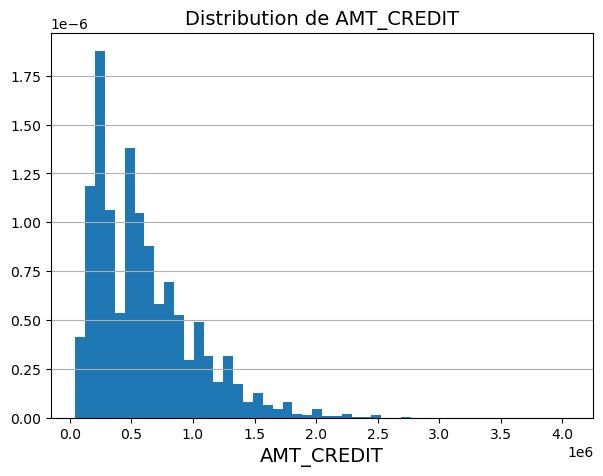

...

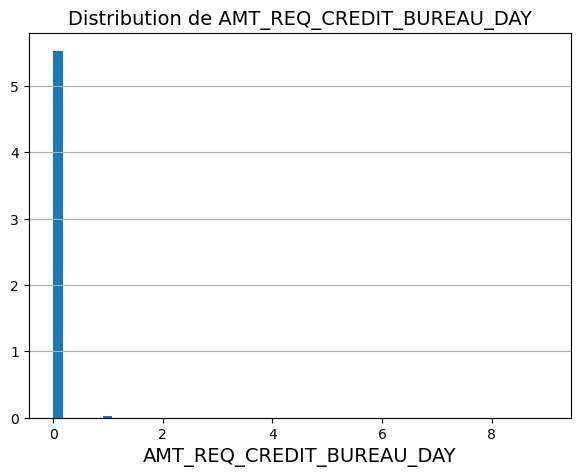

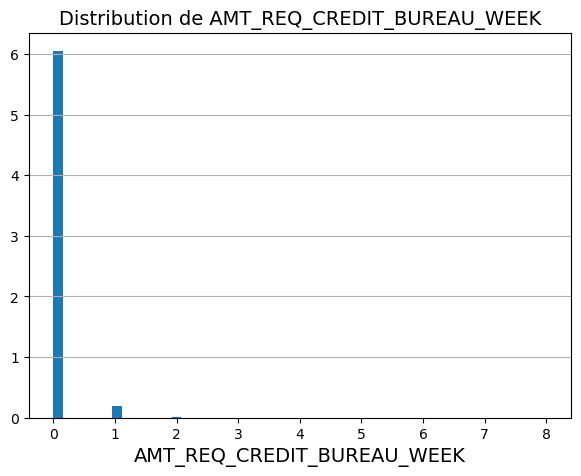

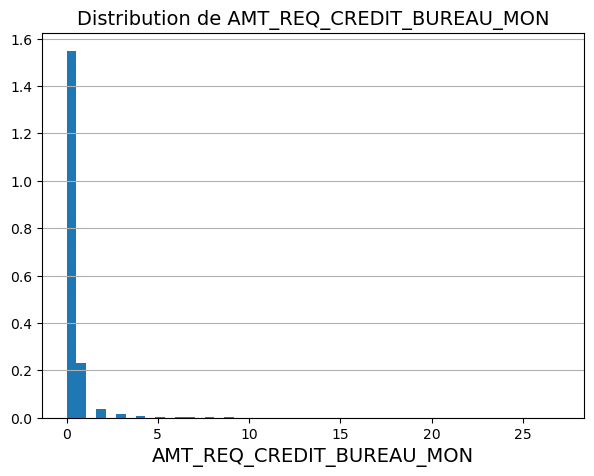

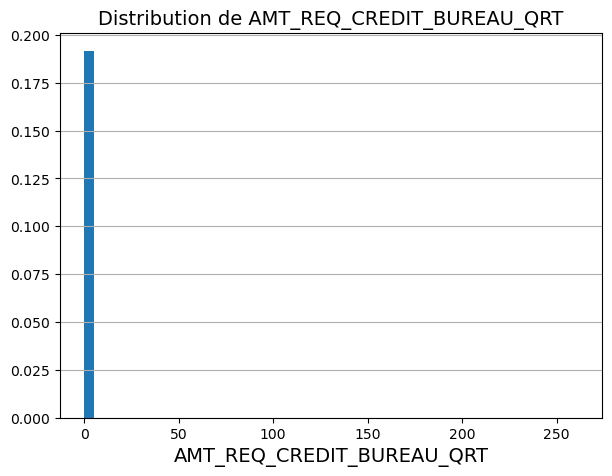

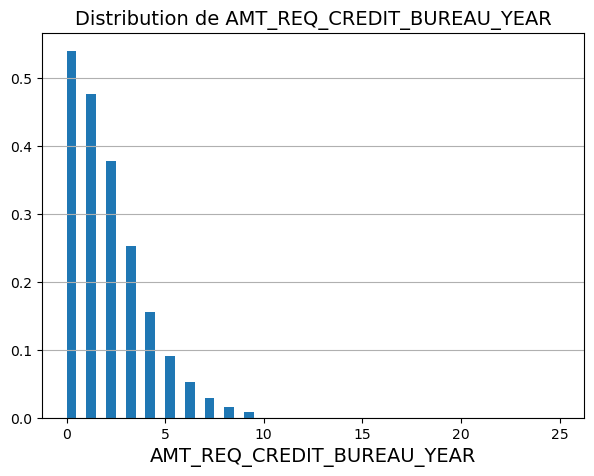

In [23]:
# Représentation de la distribution des variables numériques
for column in numerical_columns_df:

    plt.figure(figsize = (7,5))
    plt.hist(app_train_df[column], density=True,bins=50)
    plt.title('Distribution de ' + column, fontsize=14)
    plt.xlabel(column,fontsize=14)
    plt.grid(axis='y')
    plt.show()

* DAYS_EMPLOYED : The negative values means Days since employed and most probably these negative values means Unemployed. It is not clear what will be the meaning of the very large numbers at the far end (it is not realistic such a large set of people employed more than 100 years).
* DAYS_BIRTH : the negative value means that the date of birth is in the past. The age range is between approximative 20 and 68 years.

In [ ]:
# Représentation de la distribution des variables catégorielles
for column in categ_columns_df:
    labels =app_train_df[column].value_counts(normalize=True).sort_values(ascending=False).index
    values = app_train_df[column].value_counts(normalize=True).sort_values(ascending=False).values

    # Diagramme en barres (bar chart) pour la variable catégorielle
    plt.figure(figsize = (15,5))
    sns.countplot(x = app_train_df[column], order=labels)
    plt.title('Distribution de ' + column, fontsize=14)
    plt.xlabel(column,fontsize=14)
    plt.show()



* Most of the loans are Cash loans which were taken by applicants. 90.5 % loans are Cash loans.
* 51.6 % Applicants mentioned that they are working. 23.3 % are Commercial Associate and 18 % are Pensioner etc.
* 63.9 % applicants are married. 14.8 % are single etc.
* Top Applicant's who applied for loan :
* Laborers - Apprx. 55 K
    * Sales Staff - Approx. 32 K
    * Core staff - Approx. 28 K
    * Managers - Approx. 21 K
    * Drivers - Approx. 19 K
* 71 % applicants have secondary and 24.3 % having higher education.
* Approx. 89 % peoples applied for loan, they mentioned type of house is House / Appartmen
* Types of Organizations who applied for loan :
    * Business Entity Type 3 - Approx. 68 K
    * XNA - Approx. 55 K
    * Self employed - Approx. 38 K
    * Others - Approx. 17 K
    * Medicine - Approx. 11 K

### 1.3 Analyse bivariée <a class="anchor" id="section_1_3"></a>
* Représentation de la distribution de la target en fonction des modalités des variables catégorielles.
* Analyse des corrélations avec la TARGET, recherche de data leakage

In [24]:
app_train_df['TARGET'].dtype

dtype('int64')

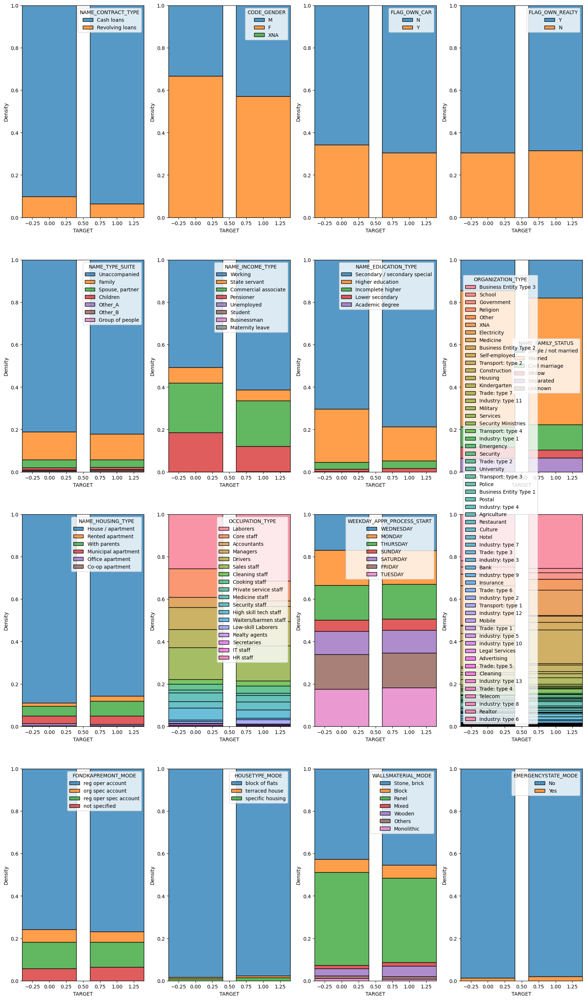

In [25]:
# Distribution de la target en fonction des modalités des variables catégorielles
plt.figure(figsize=(20,35))
for j,i in enumerate(app_train_df.select_dtypes(include = "object").columns):
    if i != "TARGET":
        plt.subplot(4,4,j+1)
        sns.histplot(
            data=app_train_df,
            x="TARGET", hue=i,
            multiple="fill", #“layer”, “dodge”, “stack”, “fill”
            stat="density",
            discrete=True, shrink=.8
        )

In [26]:
# Analyse de la target en fonction du type de contrat
pd.crosstab(app_train_df.TARGET, app_train_df.NAME_CONTRACT_TYPE, dropna=False, normalize='all')

NAME_CONTRACT_TYPE,Cash loans,Revolving loans
TARGET,,
0,0.829274,0.089997
1,0.075513,0.005216


Analyse de la target en fonction du type de contrat :
* Il existe 2 types de contrat : 
    * cash loans,
    * revolving loans.
* La grande majorité des contrats (environ 83%) sont de type cash loans.

In [27]:
# Analyse de la target en fonction du genre
pd.crosstab(app_train_df.TARGET, app_train_df.CODE_GENDER, dropna=False,normalize='all')

CODE_GENDER,F,M,XNA
TARGET,,,
0,0.612264,0.306994,0.000013
1,0.046080,0.034649,0.000000


Analyse de la target en fonction du genre :
* Le demandes de crédit sont davantage effectuées par des femmes (plus de 65%). 
* En proportion, les femmes remboursent mieux leur crédit.
* On note 4 personnes avec un genre non identifié, qui n'ont pas de difficulté de paiment.

In [28]:
# Analyse de la target en fonction de si le client possède une voiture ou non
pd.crosstab(app_train_df.TARGET, app_train_df.FLAG_OWN_CAR, dropna=False, normalize='all')

FLAG_OWN_CAR,N,Y
TARGET,,
0,0.603800,0.315472
1,0.056092,0.024637


Analyse de la target en fonction de si le le client possède une voiture ou non :
* 65 % des clients demandant un crédit ne possède pas leur propre voiture
* La proportion de clients ne possédant pas leur propre voiture est équivalante sur les 2 valeurs de la target.

In [29]:
# Analyse de la target en fonction de si le le client possède  sa résidence
pd.crosstab(app_train_df.TARGET, app_train_df.FLAG_OWN_REALTY, dropna=False, normalize='all')

FLAG_OWN_REALTY,N,Y
TARGET,,
0,0.280826,0.638445
1,0.025502,0.055227


Analyse de la target en fonction de si le  client est propriétaire ou non :
* 70 % des clients demandant un crédit sont propriétaires.
* La proportion de clients propriétaires est équivalente sur les 2 valeurs de la target (environ 70%).

In [30]:
# Analyse des demandes en fonction du type de revenu :
app_train_df.groupby(['NAME_INCOME_TYPE']).agg({'AMT_INCOME_TOTAL': ['mean', 'median', 'count']})

AMT_INCOME_TOTAL                  
                                 mean    median   count
NAME_INCOME_TYPE                                       
Businessman             652500.000000  495000.0      10
Commercial associate    202955.327289  180000.0   71617
Maternity leave         140400.000000   90000.0       5
Pensioner               136401.292273  117000.0   55362
State servant           179737.969506  157500.0   21703
Student                 170500.000000  157500.0      18
Unemployed              110536.363636   78750.0      22
Working                 163169.889223  135000.0  158774

Analyse des demandes en fonction du type de revenu :
* Plus de 50% des crédits sont pris par la catégorie des actifs (catégorie "working").
* Environ 18% sont des retraités

In [31]:
app_train_df.groupby(['NAME_EDUCATION_TYPE', 'NAME_INCOME_TYPE']).agg({'AMT_INCOME_TOTAL': ['mean', 'median', 'count', 'max']})

AMT_INCOME_TOTAL  \
                                                               mean   
NAME_EDUCATION_TYPE           NAME_INCOME_TYPE                        
Academic degree               Commercial associate    274688.372093   
                              Pensioner               203919.230769   
                              State servant           258847.826087   
                              Working                 226312.500000   
Higher education              Businessman             652500.000000   
                              Commercial associate    242283.998486   
                              Maternity leave         195000.000000   
                              Pensioner               171455.114974   
                              State servant           207116.161080   
                              Student                 231000.000000   
                              Unemployed              189000.000000   
                              Working                 194013.110125   
Incomplete higher             Commercial associate    206232.296029   
                              Pensioner               149437.155405   
                              State servant           173589.989610   
                              Student                 157500.000000   
                              Unemployed              126000.000000   
                              Working                 170659.490600   
Lower secondary               Commercial associate    168173.628261   
                              Pensioner               106468.010464   
                              State servant           143250.000000   
                              Working                 140070.652174   
Secondary / secondary special Commercial associate    181368.704601   
                              Maternity leave          58500.000000   
                              Pensioner               130863.482560   
                              State servant           159979.349061   
                              Student                 138681.818182   
                              Unemployed               70753.846154   
                              Working                 154261.801730   

                                                                       \
                                                       median   count   
NAME_EDUCATION_TYPE           NAME_INCOME_TYPE                          
Academic degree               Commercial associate  247500.00      43   
                              Pensioner             155700.00      26   
                              State servant         225000.00      23   
                              Working               202500.00      72   
Higher education              Businessman           495000.00      10   
                              Commercial associate  202500.00   24025   
                              Maternity leave       135000.00       3   
                              Pensioner             148500.00    8188   
                              State servant         180000.00    8863   
                              Student               175500.00       6   
                              Unemployed            180000.00       6   
                              Working               174134.25   33762   
Incomplete higher             Commercial associate  180000.00    3400   
                              Pensioner             135000.00     518   
                              State servant         157500.00     770   
                              Student               157500.00       1   
                              Unemployed             63000.00       3   
                              Working               157500.00    5585   
Lower secondary               Commercial associate  144000.00     460   
                              Pensioner              90000.00    1529   
                              State servant         119250.00     102   
                          

La plupart des crédit sont demandés par des "working" avec un niveau académique "secondary".

#### Analyse des corrélations - Recharche de Data leakage
Etude du data leakage : identification des variables corrélées avec la (ou les) target(s) et susceptibles de ne pas être disponibles dans le futur en entrée du modèle (risque de bonne performance du modèle d’entraînement, mais mauvaise en production)

In [32]:
# Calcul des correlations avec la TARGET 
correlations = app_train_df.corr()['TARGET'].sort_values(ascending=False)

# Affichage des correlations positives et négatives avec la TARGET 
print('Correlations négatives avec la TARGET:\n\n', correlations.tail(10))
print('\nCorrelations positives avec la TARGET :\n\n', correlations.head(10))

C:\Users\lea\AppData\Local\Temp\ipykernel_8352\1618953893.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



Correlations négatives avec la TARGET:

 ELEVATORS_AVG                -0.034199
REGION_POPULATION_RELATIVE   -0.037227
AMT_GOODS_PRICE              -0.039645
FLOORSMAX_MODE               -0.043226
FLOORSMAX_MEDI               -0.043768
FLOORSMAX_AVG                -0.044003
DAYS_EMPLOYED                -0.044932
EXT_SOURCE_1                 -0.155317
EXT_SOURCE_2                 -0.160472
EXT_SOURCE_3                 -0.178919
Name: TARGET, dtype: float64

Correlations positives avec la TARGET :

 TARGET                         1.000000
DAYS_BIRTH                     0.078239
REGION_RATING_CLIENT_W_CITY    0.060893
REGION_RATING_CLIENT           0.058899
DAYS_LAST_PHONE_CHANGE         0.055218
DAYS_ID_PUBLISH                0.051457
REG_CITY_NOT_WORK_CITY         0.050994
FLAG_EMP_PHONE                 0.045982
REG_CITY_NOT_LIVE_CITY         0.044395
FLAG_DOCUMENT_3                0.044346
Name: TARGET, dtype: float64


C:\Users\lea\AppData\Local\Temp\ipykernel_8352\3423151982.py:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



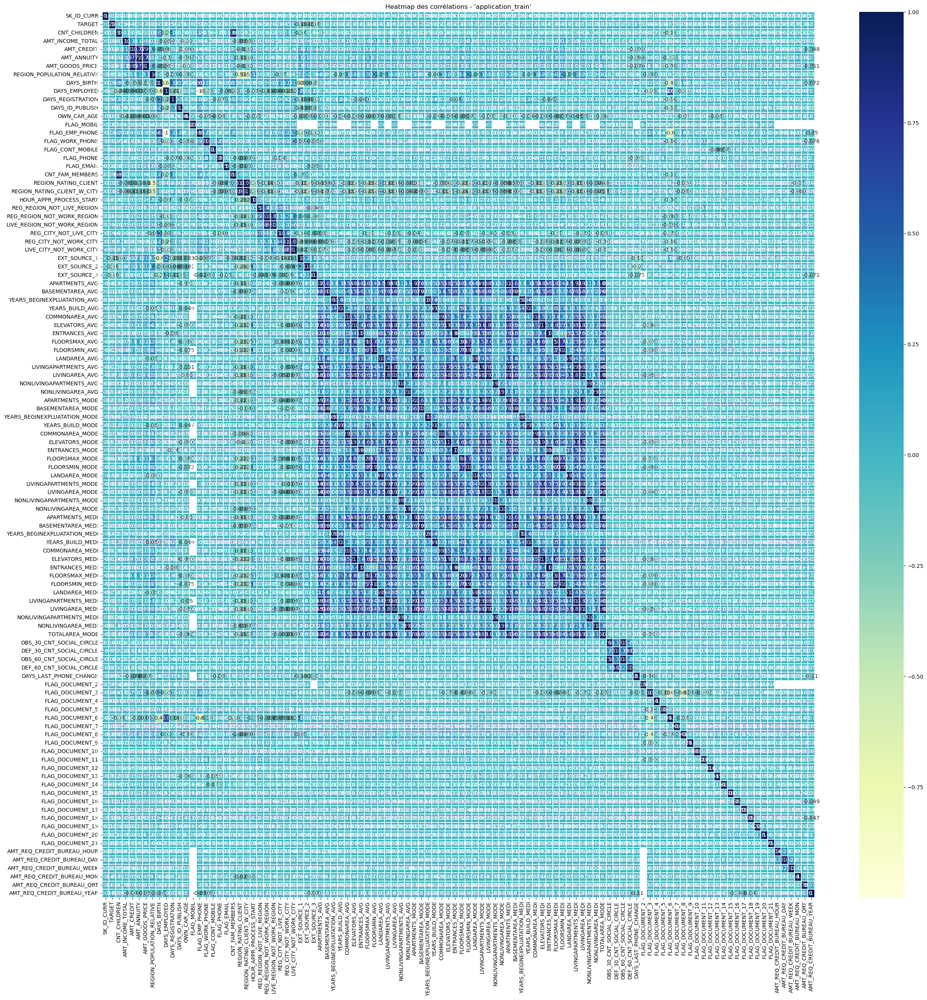

In [33]:
# Affichage de la heatmap des corrélations
plt.figure(figsize=(30,30))
sns.heatmap(app_train_df.corr() , annot=True, linewidths=.2, cmap="YlGnBu")
plt.title("Heatmap des corrélations - 'application_train'");

Les 3 variables avec la plus forte corrélation négative avec la TARGET sont EXT_SOURCE_1, EXT_SOURCE_2, and EXT_SOURCE_3. 

In [34]:
# Signification des variables EXT_SOURCE ?
print(column_description.loc[column_description['Row']=='EXT_SOURCE_1'].Description.tolist())
print(column_description.loc[column_description['Row']=='EXT_SOURCE_2'].Description.tolist())
print(column_description.loc[column_description['Row']=='EXT_SOURCE_3'].Description.tolist())

['Normalized score from external data source']
['Normalized score from external data source']
['Normalized score from external data source']


Selon la table de description des variablesles variables EXT_SOURCE sont une "normalized score from external data source". 
Peut être un scoring crédit  établi à partir de diverses sources de données externes. Plus ce score est élévé, moins on a de risque Regardons de plus près les 3 variables les plus corrélées positivement et négativement à la TARGET.

In [35]:
# Correlations des 3 variables les plus corrélées positivement et négativement à la TARGET.
# Extraction des variables  EXT_SOURCE et calcul des correlations.
ext_data = app_train_df[['TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH','REGION_RATING_CLIENT_W_CITY','REGION_RATING_CLIENT']]
ext_data_corrs = ext_data.corr()
ext_data_corrs

,TARGET,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT
TARGET,1.000000,-0.155317,-0.160472,-0.178919,0.078239,0.060893,0.058899
EXT_SOURCE_1,-0.155317,1.000000,0.213982,0.186846,-0.600610,-0.115374,-0.115341
EXT_SOURCE_2,-0.160472,0.213982,1.000000,0.109167,-0.091996,-0.288299,-0.292895
EXT_SOURCE_3,-0.178919,0.186846,0.109167,1.000000,-0.205478,-0.012158,-0.012903
DAYS_BIRTH,0.078239,-0.600610,-0.091996,-0.205478,1.000000,0.008073,0.009361
REGION_RATING_CLIENT_W_CITY,0.060893,-0.115374,-0.288299,-0.012158,0.008073,1.000000,0.950842
REGION_RATING_CLIENT,0.058899,-0.115341,-0.292895,-0.012903,0.009361,0.950842,1.000000


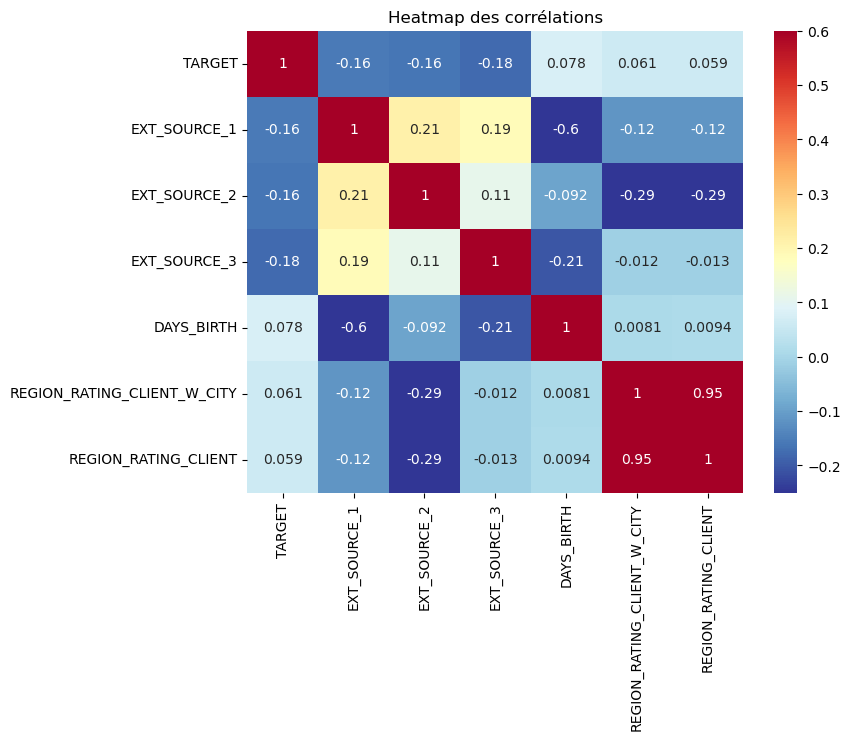

In [36]:
# Heatmap des correlations
plt.figure(figsize = (8, 6))
sns.heatmap(ext_data_corrs, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Heatmap des corrélations');


Lorsque la valeur de EXT_SOURCE augemente, the client est plus suceptible de rembouser son crédit. 
DAYS_BIRTH semble être négaitvement corrélé à EXT_1.

In [37]:
# Comment sont remplies les variables les plus corrélées à la TARGET dans les données de test (application_test.csv)?
app_test_df[[ 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH','REGION_RATING_CLIENT_W_CITY','REGION_RATING_CLIENT']].info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Data columns (total 6 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   EXT_SOURCE_1                 28212 non-null  float64
 1   EXT_SOURCE_2                 48736 non-null  float64
 2   EXT_SOURCE_3                 40076 non-null  float64
 3   DAYS_BIRTH                   48744 non-null  int64  
 4   REGION_RATING_CLIENT_W_CITY  48744 non-null  int64  
 5   REGION_RATING_CLIENT         48744 non-null  int64  
dtypes: float64(3), int64(3)
memory usage: 2.2 MB


## Partie 2 :  Feature enginnering  <a class="anchor" id="partie2"></a>
Le travail de feature engineering s'appuie sur ce kernel Kaggle : https://www.kaggle.com/code/jsaguiar/lightgbm-with-simple-features/script


In [39]:
####################################
# FONCTIONS DE FEATURE ENGINEERING #
###################################

# Most features are created by applying min, max, mean, sum and var functions to grouped tables. 
# Little feature selection is done and overfitting might be a problem since many features are related.
# The following key ideas were used:
# - Divide or subtract important features to get rates (like annuity and income, Payment Rate)
# - In Bureau Data: create specific features for Active credits and Closed credits
# - In Previous Applications: create specific features for Approved and Refused applications
# - Modularity: one function for each table (except bureau_balance and application_test)
# - One-hot encoding for categorical features
# All tables are joined with the application DF using the SK_ID_CURR key (except bureau_balance).

@contextmanager

def timer(title):
    t0 = time.time()
    yield
    print("{} - done in {:.0f}s".format(title, time.time() - t0))

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("application_test samples: {}".format(len(df)))

    print("application_train samples: {}, application_test samples: {}".format(len(df), len(test_df)))
    df = df.append(test_df).reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA'] # 4 lignes avec le code XNA pour CODE_GENDER qu'on ne retrouve pas dans le testset
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']: # les variables avec 2 catégories
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan  (valeur aberrante)
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # LZ - NaN values for AMT_INCOME_TOTAL: 1.170000e+08 -> nan  (valeur aberrante)
    df['AMT_INCOME_TOTAL'].replace(1.170000e+08, np.nan, inplace= True)
    
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg
    
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg


#############################################
# Fonction complète de feature engineering #
############################################
def feature_engineering(num_rows=None):
    
    df = application_train_test(num_rows)
    with timer("Process bureau and bureau_balance"):
        bureau = bureau_and_balance(num_rows)
        print("Bureau df shape:", bureau.shape)
        df = df.join(bureau, how='left', on='SK_ID_CURR')
        del bureau
        gc.collect()
    with timer("Process previous_applications"):
        prev = previous_applications(num_rows)
        print("Previous applications df shape:", prev.shape)
        df = df.join(prev, how='left', on='SK_ID_CURR')
        del prev
        gc.collect()
    with timer("Process POS-CASH balance"):
        pos = pos_cash(num_rows)
        print("Pos-cash balance df shape:", pos.shape)
        df = df.join(pos, how='left', on='SK_ID_CURR')
        del pos
        gc.collect()
    with timer("Process installments payments"):
        ins = installments_payments(num_rows)
        print("Installments payments df shape:", ins.shape)
        df = df.join(ins, how='left', on='SK_ID_CURR')
        del ins
        gc.collect()
    with timer("Process credit card balance"):
        cc = credit_card_balance(num_rows)
        print("Credit card balance df shape:", cc.shape)
        df = df.join(cc, how='left', on='SK_ID_CURR')
        del cc
        gc.collect()
    df.to_csv('data_feature_engin')
    return df

### Test des fonctions de feature engineering

In [ ]:
num_rows=None
df = application_train_test(num_rows)
with timer("Process bureau and bureau_balance"):
    bureau = bureau_and_balance(num_rows)
    print("Bureau df shape:", bureau.shape)
    df = df.join(bureau, how='left', on='SK_ID_CURR') 

application_test samples: 307511
application_train samples: 307511, application_test samples: 48744


C:\Users\lea\AppData\Local\Temp\ipykernel_2692\2204581675.py:39: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [ ]:
with timer("Process previous_applications"):
    prev = previous_applications(num_rows)
    print("Previous applications df shape:", prev.shape)
    df = df.join(prev, how='left', on='SK_ID_CURR')

In [ ]:
with timer("Process POS-CASH balance"):
    pos = pos_cash(num_rows)
    print("Pos-cash balance df shape:", pos.shape)
    df = df.join(pos, how='left', on='SK_ID_CURR')

In [ ]:
with timer("Process installments payments"):
    ins = installments_payments(num_rows)
    print("Installments payments df shape:", ins.shape)
    df = df.join(ins, how='left', on='SK_ID_CURR')

In [ ]:
with timer("Process credit card balance"):
    cc = credit_card_balance(num_rows)
    print("Credit card balance df shape:", cc.shape)
    df = df.join(cc, how='left', on='SK_ID_CURR')

In [ ]:
# Dataframe de travail, issu du prepocessing et du feature engineering
df

In [ ]:
# Calcul des correlations avec la TARGET 
correlations_full = df.corr()['TARGET'].sort_values(ascending=False)
#Affichage des correlations positives et négatives avec la TARGET 
print('Correlations positives avec la TARGET:\n\n', correlations_full.tail(50))
print('\nCorrelations négatives avec la TARGET :\n\n', correlations_full.head(10))

In [ ]:
# Affichage des correlations positives et négatives avec la TARGET 
print('Correlations positives avec la TARGET:\n\n', correlations_full.tail(50))
print('\nCorrelations négatives avec la TARGET :\n\n', correlations_full.head(10))

## Partie 3 :  Preprocessing  <a class="anchor" id="partie3"></a>
* Imputation des valeurs manquantes
* Traitement du déséquilibre de la TARGET avec SMOTE

In [182]:
###############################
# FONCTIONS DE PREPROCESSING  #
###############################

# Function to calculate missing values by column
def missing_values_table(df):
    # Taux de valeurs manquantes :
    print("Taux de valeurs manquantes dans le df avant imputatation :" , round(df.isna().mean().mean(),4))
    # Total missing values
    mis_val = df.isnull().sum()
    
    # Percentage of missing values
    mis_val_percent = 100 * df.isnull().sum() / len(df)
    
    # Make a table with the results
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
    
    # Rename the columns
    mis_val_table_ren_columns = mis_val_table.rename(columns = {0 : 'Missing Values', 1 : '% of Total Values'})
    
    # Sort the table by percentage of missing descending
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
    
    # Print some summary information
    print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"
           "There are " + str(mis_val_table_ren_columns.shape[0]) +
           " columns that have missing values.")
    
    # Return the dataframe with missing information
    return mis_val_table_ren_columns


# Imputation des valeurs manquantes
def missing_values_imputation(df) :
    #  Statistiques sur les valeurs manquantes :
    missing_values = missing_values_table(df)
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    
    # Séparation du jeu de données en jeu de  training/validation et jeu de test
    train_df = df[df['TARGET'].notnull()] # partie du jeu de données qui contient une target
    test_df = df[df['TARGET'].isnull()] # partie du jeu de données qui n'a pas de target
    print(train_df.shape, test_df.shape)
    train_df["TARGET"].value_counts()/train_df.shape[0]
    
    # Taux de valeurs manquantes :
    print("Taux de valeurs manquantes dans jeu de train avant imputatation :" , round(train_df.isna().mean().mean(),4))
    print("Taux de valeurs manquantes dans jeu de test avant imputatation :" , round(test_df.isna().mean().mean(),4))
    
    # Imputation des valeurs manquantes avec un KNN ( defaut k =5)
    with timer("Imputation des valeurs manquantes avec KNN"):
        knn_imputer = KNNImputer()
        #fit and transform 
        train_df_imputed=knn_imputer.fit_transform(train_df)
        test_df_imputed=knn_imputer.transform(test_df)
        train_df_imputed = pd.DataFrame(train_df_imputed, columns = train_df.columns)
        test_df_imputed = pd.DataFrame(test_df_imputed, columns = test_df.columns)

    feats_test = [f for f in test_df.columns if f not in ['TARGET']]
    test_df_imputed=test_df_imputed.filter(feats_test)
    # Taux de valeurs manquantes :
    print("Taux de valeurs manquantes après imputatation - jeu de train:" , round(train_df_imputed.isna().mean().mean(),4))
    print("Taux de valeurs manquantes après imputatation - jeu de test:" , round(test_df_imputed.isna().mean().mean(),4))
    
    return train_df_imputed,test_df_imputed



# Traitement du déséquilibre de classe de la target avec SMOTE
def umbalanced_data_SMOTE(train_df_imputed) :
    #y_train
    y_train=train_df_imputed['TARGET']
    y_train 
    
    #X_train
    feats = [f for f in train_df_imputed.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
    X_train=train_df_imputed.filter(feats)
    
    # Représentation déséquilibre de la target
    fig,ax=plt.subplots(figsize=(7,6))
    plt.title("Distribution de la target \n(Jeu d'entraînement)", fontsize=15)
    sns.countplot(x='TARGET', data=train_df_imputed)
    for container in ax.containers:
        ax.bar_label(container,size=12,fmt='%.0f')
    plt.show()
   
    # Traitement des classes déséquilibrées avec SMOTE sur le jeu de données d'entraînement
    with timer("Traitement de la target déséquilibrée avec SMOTE"):
        smote = SMOTE()
        # fit predictor and target variable
        X_smote, y_smote = smote.fit_resample(X_train, y_train)
        print('Original dataset shape', y_train.shape)
        print('Resample dataset shape',y_smote.shape) 
        print('SMOTE a crée des données pour que la classe minoritaire ( target = 1 ) ait la même taille que la classe majoritaire.\n',y_smote.value_counts())
    y_smote.value_counts()   
    X_smote.shape
    return X_smote, y_smote


# FONTION COMPLETE DE PREPROCESSING
def preprocessing(df,num_rows=None):
    df = df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))  # Change columns names ([LightGBM] Do not support special JSON characters in feature name.)
    train_df_imputed,test_df_imputed=missing_values_imputation(df) # Imputation des valeurs manquantes
    X_smote, y_smote=umbalanced_data_SMOTE(train_df_imputed) # traitement du déséquilibre de classe
    return X_smote, y_smote, test_df_imputed

### Test des fonctions de preprocessing

### 3.1 Imputation des valeurs manquantes  <a class="anchor" id="section_3_1"></a>

In [ ]:
with timer ("Imputation des valeurs manquantes") :
     #  Statistiques sur les valeurs manquantes :
    missing_values = missing_values_table(df)
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    
    # Séparation du jeu de données en jeu de  training/validation et jeu de test
    train_df = df[df['TARGET'].notnull()] # partie du jeu de données qui contient une target
    test_df = df[df['TARGET'].isnull()] # partie du jeu de données qui n'a pas de target
    print(train_df.shape, test_df.shape)
    train_df["TARGET"].value_counts()/train_df.shape[0]
    
    # Taux de valeurs manquantes :
    print("Taux de valeurs manquantes dans jeu de train avant imputatation :" , round(train_df.isna().mean().mean(),4))
    print("Taux de valeurs manquantes dans jeu de test avant imputatation :" , round(test_df.isna().mean().mean(),4))
    
    # Imputation des valeurs manquantes avec un KNN ( defaut k =5)
    with timer("Imputation des valeurs manquantes avec KNN"):
        knn_imputer = KNNImputer()
        fit and transform 
        train_df_imputed=knn_imputer.fit_transform(train_df)
        test_df_imputed=knn_imputer.transform(test_df)
        train_df_imputed = pd.DataFrame(train_df_imputed, columns = train_df.columns)
        test_df_imputed = pd.DataFrame(test_df_imputed, columns = test_df.columns)
    
    # Imputation des valeurs manquantes par la moyenne
    #train_df_imputed=train_df.fillna(train_df.mean())
    #test_df_imputed=train_df.fillna(train_df.mean())
    
    # Taux de valeurs manquantes :
    print("Taux de valeurs manquantes après imputatation - jeu de train:" , round(train_df_imputed.isna().mean().mean(),4))
    print("Taux de valeurs manquantes après imputatation - jeu de test:" , round(test_df_imputed.isna().mean().mean(),4))

### 3.2 Traitement du déséquilibre de classes  <a class="anchor" id="section_3_2"></a>

* La distribution de la TARGET dans le jeu de données d'entraînement présente un fort déséquilibre de classes : environ 92% pour la classe 0 et environ 8% pour la classe 1. 
* Il s’agit d’une situation fréquente dans les problématiques de classification liée à une détection d’anomalie, notamment dans le secteur bancaire (fraude, remboursement de crédit,...), qui doit néanmoins être pris en compte pour entraîner de façon pertinente un modèle. En effet, un modèle « naïf » qui prédirait systématiquement une TARGET à 0 aurait une “accuracy” de 0.92 et pourrait être considéré, à tort, comme un modèle performant alors qu’il ne permettrait pas de détecter les anomalies. Ce déséquilibre entraîne donc un biais en faveur de la classe majoritaire, un sur apprentissage sur la classe majoritaire, et une mauvaise généralisation et donc une mauvaise performance sur la classe minoritaire.
* Pour gérer l’entraînement du modèle avec déséquilibre de classes, il existe différentes techniques telles que le sur échantillonnage de la classe minoritaire, le sous-échantillonnage de classe majoritaire, l’utilisation du paramètre class_weight des algorithmes de classification ou encore la technique SMOTE qui est celle mise en œuvre dans ce projet.
* La technique SMOTE (Synthetic Minority Oversampling Technique) largement utilisée, génère des données synthétiques pour la classe minoritaire. SMOTE fonctionne en choisissant au hasard un point de la classe minoritaire et en calculant les k plus proches voisins pour ce point. Les points synthétiques sont ajoutés entre le point choisi et ses voisins. (Package python : Imbalanced Learn)
* Un jeu de données d’entraînement ainsi équilibré va améliorer la généralisation du modèle en augmentant le nombre d’exemples d’entraînement. Les performances du modèle se trouvent ainsi améliorées.

In [ ]:
with timer ("Traitement SMOTE déséquilibre de classe") :
    #y_train
    y_train=train_df_imputed['TARGET']
    y_train 
    
    #X_train
    feats = [f for f in train_df_imputed.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
    X_train=train_df_imputed.filter(feats)
    
    # Représentation déséquilibre de la target
    fig,ax=plt.subplots(figsize=(7,6))
    plt.title("Distribution de la target \n(Jeu d'entraînement)", fontsize=15)
    sns.countplot(x='TARGET', data=train_df_imputed)
    for container in ax.containers:
        ax.bar_label(container,size=12,fmt='%.0f')
    plt.show()
   
    # Traitement des classes déséquilibrées avec SMOTE sur le jeu de données d'entraînement
    with timer("Traitement de la target déséquilibrée avec SMOTE"):
        smote = SMOTE()
        # fit predictor and target variable
        X_smote, y_smote = smote.fit_resample(X_train, y_train)
        print('Original dataset shape', y_train.shape)
        print('Resample dataset shape',y_smote.shape) 
        print('SMOTE a crée des données pour que la classe minoritaire ( target = 1 ) ait la même taille que la classe majoritaire.\n',y_smote.value_counts())
    y_smote.value_counts()   
    X_smote.shape

In [ ]:
#Test de la fonction qui effectue imputation des valeurs manquantes + SMOTE
with timer("préprocessing"):
    X_smote, y_smote, test_df_imputed=preprocessing(df.sample(500))

### 3.3 Fonction complète de préparation des données

In [48]:
# A SUPPRIMER Feature engineeging
# Dataset complet issu du feature engineering, sans le traitement des valeurs manquantes et sans SMOTE

with timer("Feature engineering"):
    feat_engin_data=feature_engineering(num_rows=None)
    feat_engin_data.to_csv("feat_engin_data.csv",index=False)

application_test samples: 307511
application_train samples: 307511, application_test samples: 48744


C:\Users\lea\AppData\Local\Temp\ipykernel_8352\2204581675.py:39: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Bureau df shape: (305811, 116)
Process bureau and bureau_balance - done in 15s
Previous applications df shape: (338857, 249)
Process previous_applications - done in 17s
Pos-cash balance df shape: (337252, 18)
Process POS-CASH balance - done in 8s
Installments payments df shape: (339587, 26)
Process installments payments - done in 24s
Credit card balance df shape: (103558, 141)
Process credit card balance - done in 12s
Feature engineering - done in 280s


In [46]:
feat_engin_data

,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
0,0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
4,4,100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
356250,48739,456221,NaN,1,0,0,0,121500.0,412560.0,17473.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
356251,48740,456222,NaN,1,0,1,2,157500.0,622413.0,31909.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
356252,48741,456223,NaN,1,1,0,1,202500.0,315000.0,33205.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
356253,48742,456224,NaN,0,0,1,0,225000.0,450000.0,25128.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [50]:
feat_engin_data_from_csv_file=pd.read_csv("feat_engin_data.csv")
feat_engin_data_from_csv_file

,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
0,0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
4,4,100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
356246,48739,456221,NaN,1,0,0,0,121500.0,412560.0,17473.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
356247,48740,456222,NaN,1,0,1,2,157500.0,622413.0,31909.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
356248,48741,456223,NaN,1,1,0,1,202500.0,315000.0,33205.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
356249,48742,456224,NaN,0,0,1,0,225000.0,450000.0,25128.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Taux de valeurs manquantes dans le df avant imputatation : 0.2524
Your selected dataframe has 798 columns.
There are 614 columns that have missing values.
(8598, 798) (1402, 798)
Taux de valeurs manquantes dans jeu de train avant imputatation : 0.2575
Taux de valeurs manquantes dans jeu de test avant imputatation : 0.221
Imputation des valeurs manquantes avec KNN - done in 273s
Taux de valeurs manquantes après imputatation - jeu de train: 0.0
Taux de valeurs manquantes après imputatation - jeu de test: 0.0


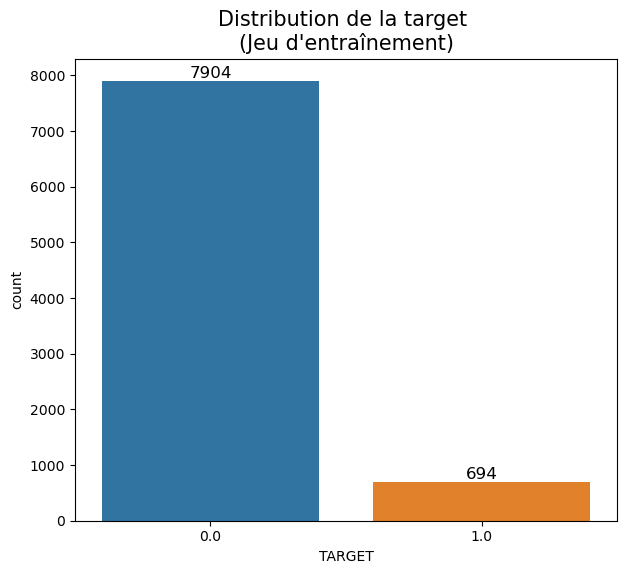

2023/05/16 21:08:27 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '017a7397f3d74a57a074ad36cd41ee44', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2023/05/16 21:08:27 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: The configured tracking uri scheme: 'file' is invalid for use with the proxy mlflow-artifact scheme. The allowed tracking schemes are: {'http', 'https'}


Original dataset shape (8598,)
Resample dataset shape (15808,)
SMOTE a crée des données pour que la classe minoritaire ( target = 1 ) ait la même taille que la classe majoritaire.
 0.0    7904
1.0    7904
Name: TARGET, dtype: int64
Traitement de la target déséquilibrée avec SMOTE - done in 0s
préprocessing - done in 274s


In [201]:
# preprocessing : imputation des valeurs manquantes, ttt du déséquilibre de classe avec SMOTE
with timer("préprocessing"):
    X_smote, y_smote, test_df_imputed=preprocessing(feat_engin_data.sample(10000))
    test_df_imputed.to_csv("test_df_imputed_file.csv",index=False)

In [86]:
pd.read_csv("test_df_imputed_file.csv")

,index,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
0,22228.0,261635.0,0.0,1.0,0.0,0.0,45000.0,52128.0,5602.5,45000.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,10.0
1,31049.0,325710.0,0.0,0.0,0.0,0.0,67500.0,260640.0,26838.0,225000.0,...,0.4,0.052128,0.4,0.052128,0.0,0.0,0.0,0.0,0.0,23.8
2,28778.0,309887.0,0.0,0.0,1.0,2.0,202500.0,724500.0,46431.0,724500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,40.4
3,29080.0,311934.0,1.0,1.0,1.0,0.0,216000.0,904500.0,32485.5,904500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,3.0
4,4101.0,129274.0,1.0,0.0,0.0,0.0,153000.0,361998.0,18612.0,292500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,92.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1322,30587.0,322339.0,1.0,0.0,0.0,0.0,180000.0,522396.0,30118.5,472500.0,...,0.2,0.002740,0.2,0.002740,0.0,0.0,0.0,0.0,0.0,25.2
1323,28139.0,305301.0,0.0,1.0,0.0,1.0,157500.0,594121.5,32359.5,472500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,6.2
1324,40250.0,396414.0,1.0,0.0,0.0,1.0,157500.0,641173.5,32868.0,553500.0,...,0.2,0.050000,0.2,0.052128,0.0,0.0,0.0,0.0,0.0,24.0
1325,36440.0,366674.0,0.0,0.0,0.0,2.0,225000.0,410400.0,48834.0,369000.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,20.0


In [87]:
# jeu de test transformé
test_df_imputed

,index,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
0,22228.0,261635.0,0.0,1.0,0.0,0.0,45000.0,52128.0,5602.5,45000.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,10.0
1,31049.0,325710.0,0.0,0.0,0.0,0.0,67500.0,260640.0,26838.0,225000.0,...,0.4,0.052128,0.4,0.052128,0.0,0.0,0.0,0.0,0.0,23.8
2,28778.0,309887.0,0.0,0.0,1.0,2.0,202500.0,724500.0,46431.0,724500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,40.4
3,29080.0,311934.0,1.0,1.0,1.0,0.0,216000.0,904500.0,32485.5,904500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,3.0
4,4101.0,129274.0,1.0,0.0,0.0,0.0,153000.0,361998.0,18612.0,292500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,92.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1322,30587.0,322339.0,1.0,0.0,0.0,0.0,180000.0,522396.0,30118.5,472500.0,...,0.2,0.002740,0.2,0.002740,0.0,0.0,0.0,0.0,0.0,25.2
1323,28139.0,305301.0,0.0,1.0,0.0,1.0,157500.0,594121.5,32359.5,472500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,6.2
1324,40250.0,396414.0,1.0,0.0,0.0,1.0,157500.0,641173.5,32868.0,553500.0,...,0.2,0.050000,0.2,0.052128,0.0,0.0,0.0,0.0,0.0,24.0
1325,36440.0,366674.0,0.0,0.0,0.0,2.0,225000.0,410400.0,48834.0,369000.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,20.0


## Partie 4 :  Modélisation  <a class="anchor" id="partie4"></a>
* Nous allons comparer 3 modèles ensemblistes connus pour leur performances notamment sur des données de grandes dimensions et sur des problématiques telles que la nôtre : XGBoost, LightGBM, RandomForest.
* Nous utilisons une grille de recherche avec validation croisée (GridSearchCV) pour l’optimisation des hyperparamètres et comparer les performances de nos 3 modèles. 
* Pour la cross validation, l’utilisation de StratifiedKFold permet de prendre en compte la distribution de la target et de construire des folds avec une distribution de classe représentative de la distribution dans le jeu de données d’entraînement complet.
* Pour l’évaluation, nous mettons en place un score métier adapté à la problématique, le F-beta score avec beta=2 (cf. note méthodologique partie “Fonction de coût”) pour comparer les modèles, choisir le meilleur modèle et les meilleurs hyperparamètres associés. En parallèle nous maintenons également pour comparaison et contrôle des métriques techniques telles que l’AUC (Area Under the Receiver Operating Characteristic Curve) et l’accuracy (fraction de prédictions correctes).

#### Séparation des données train / test

In [202]:
# Sépration en jeu d'entrainement / jeu de validation, 80% des données pour l'entraînement
X_train, X_test, y_train, y_test = model_selection.train_test_split(X_smote, y_smote, train_size=0.8)

# vérification de la taille des matrices :
X_train.shape, X_test.shape

((12646, 795), (3162, 795))

In [237]:
##########################
# FONCTIONS MLFlow       #
#########################
# ML FLOW
def fetch_logged_data(run_id):
    client = MlflowClient()
    data = client.get_run(run_id).data
    tags = {k: v for k, v in data.tags.items() if not k.startswith("mlflow.")}
    artifacts = [f.path for f in client.list_artifacts(run_id, "model")]
    return data.params, data.metrics, tags, artifacts


##########################
# FONCTIONS MODELISATION #
#########################

# LightGBM GBDT with KFold or Stratified KFold
# Parameters from Tilii kernel: https://www.kaggle.com/tilii7/olivier-lightgbm-parameters-by-bayesian-opt/code
def kfold_lightgbm(df, num_folds, stratified = False, debug= False):
    # LZ : Change columns names ([LightGBM] Do not support special JSON characters in feature name.)
    df = df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
    
    # LZ : enable auto logging
    # LZ : this includes lightgbm.sklearn estimators
    mlflow.lightgbm.autolog()
    
    # Divide in training/validation and test data
    train_df = df[df['TARGET'].notnull()]
    test_df = df[df['TARGET'].isnull()]
    print("Starting LightGBM. Train shape: {}, test shape: {}".format(train_df.shape, test_df.shape))
    del df
    gc.collect()
    # Cross validation model
    if stratified:
        folds = StratifiedKFold(n_splits= num_folds, shuffle=True, random_state=1001)
    else:
        folds = KFold(n_splits= num_folds, shuffle=True, random_state=1001)
    # Create arrays and dataframes to store results
    oof_preds = np.zeros(train_df.shape[0])
    sub_preds = np.zeros(test_df.shape[0])
    feature_importance_df = pd.DataFrame()
    feats = [f for f in train_df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
    
    for n_fold, (train_idx, valid_idx) in enumerate(folds.split(train_df[feats], train_df['TARGET'])):
        train_x, train_y = train_df[feats].iloc[train_idx], train_df['TARGET'].iloc[train_idx]
        valid_x, valid_y = train_df[feats].iloc[valid_idx], train_df['TARGET'].iloc[valid_idx]

        # LightGBM parameters found by Bayesian optimization
        clf = LGBMClassifier(
            nthread=4,
            n_estimators=10000,
            learning_rate=0.02,
            num_leaves=34,
            colsample_bytree=0.9497036,
            subsample=0.8715623,
            max_depth=8,
            reg_alpha=0.041545473,
            reg_lambda=0.0735294,
            min_split_gain=0.0222415,
            min_child_weight=39.3259775,
            silent=-1,
            verbose=-1, )

        clf.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)], 
            eval_metric= 'auc', verbose= 200, early_stopping_rounds= 200)

        oof_preds[valid_idx] = clf.predict_proba(valid_x, num_iteration=clf.best_iteration_)[:, 1]
        sub_preds += clf.predict_proba(test_df[feats], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits

        fold_importance_df = pd.DataFrame()
        fold_importance_df["feature"] = feats
        fold_importance_df["importance"] = clf.feature_importances_
        fold_importance_df["fold"] = n_fold + 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
        print('Fold %2d AUC : %.6f' % (n_fold + 1, roc_auc_score(valid_y, oof_preds[valid_idx])))
        
        # LZ
        run_id = mlflow.last_active_run().info.run_id
        print("Logged data and model in run {}".format(run_id))

        
        del clf, train_x, train_y, valid_x, valid_y
        gc.collect()

    print('Full AUC score %.6f' % roc_auc_score(train_df['TARGET'], oof_preds))
    # Write submission file and plot feature importance
    if not debug:
        test_df['TARGET'] = sub_preds
        test_df[['SK_ID_CURR', 'TARGET']].to_csv("submission_file_name.csv", index= False)
    display_importances(feature_importance_df)
    return feature_importance_df



    # LZ
    run_id = mlflow.last_active_run().info.run_id
    print("Logged data and model in run {}".format(run_id))

    
    return feature_importance_df




# Display/plot feature importance
def display_importances(feature_importance_df_):
    cols = feature_importance_df_[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)[:40].index
    best_features = feature_importance_df_.loc[feature_importance_df_.feature.isin(cols)]
    plt.figure(figsize=(8, 10))
    sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()
    plt.savefig('lgbm_importances01.png')



### Métrique évaluation du modèle 
Nous allons créer une fonction de coût qui permet la minimisation du coût d’erreur de prédiction des FN et FP) pour comparer les modèles, afin de choisir le meilleur modèle et ses meilleurs hyperparamètres.

On suppose, par exemple, que le coût d’un FN est dix fois supérieur au coût d’un FP. On utilise le F-Beta Score avec beta = 2 afin de donner une importance plus grande au rappel.

En parallèle, on maintient, pour comparaison et contrôle, des mesures plus techniques, telles que l’AUC et l’accuracy.

In [204]:
# Définition des métriques de performance
scoring = {
    'fbeta_score': make_scorer(fbeta_score, beta=2),
    'auc_score': make_scorer(roc_auc_score),
    'accuracy': make_scorer(accuracy_score)
}

### Comparaison des modèles <a class="anchor" id="section_4_1"></a>

### Test modèle Light GBM

In [ ]:
# fonction issue du Kernel Kaggle
df = feat_engin_data.sample(200)
with timer("Run LightGBM with kfold"):
    feat_importance = kfold_lightgbm(df, num_folds= 10, stratified= False, debug= False)

#### Grille de Recherche avec Validation croisée

In [205]:
# enable autologging
mlflow.set_experiment("CreditScoring")
mlflow.lightgbm.autolog()

print("Starting LightGBM. Train shape: {}, test shape: {}".format(X_train.shape, X_test.shape))
#Initialisation du classifieur
lgbm=LGBMClassifier(random_state=42)
# Paramètres de la grille de recherche
lgbm_parameters_grid = { 'n_estimators': [200, 500,1000],
                        'learning_rate': [0.02,0.1,0.5],
                        'max_depth' : [3,5,8],
                       }

# Initialisation de la grille de recherhce
lgbm_grid_search = GridSearchCV(estimator=lgbm, 
                              param_grid=lgbm_parameters_grid,
                              scoring=scoring,
                              refit='fbeta_score',                              
                              cv= 5,
                              n_jobs=10,
                              verbose=True)

Starting LightGBM. Train shape: (12646, 795), test shape: (3162, 795)


In [ ]:
with timer("LightGBM grid_search"):
    with mlflow.start_run() as run:
        lgbm_grid_search.fit(X_train, y_train)

#### Meilleurs score et meilleurs hyperparamètres

In [207]:
print(lgbm_grid_search.best_score_, lgbm_grid_search.best_params_) # Affiche le meilleur score  et les meilleurs hyperparamètres.
lgbm_grid_search.best_estimator_.score(X_test, y_test) # prédiction sur la base de test avec à partir du modèle entraîné

0.9324929098244892 {'learning_rate': 0.5, 'max_depth': 5, 'n_estimators': 200}


0.9557242251739405

In [208]:
lgbm_grid_results = pd.DataFrame(lgbm_grid_search.cv_results_)
lgbm_grid_results 

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_max_depth,param_n_estimators,params,split0_test_fbeta_score,split1_test_fbeta_score,...,std_test_auc_score,rank_test_auc_score,split0_test_accuracy,split1_test_accuracy,split2_test_accuracy,split3_test_accuracy,split4_test_accuracy,mean_test_accuracy,std_test_accuracy,rank_test_accuracy
0,17.071554,0.114217,0.112483,0.011698,0.02,4,200,"{'learning_rate': 0.02, 'max_depth': 4, 'n_est...",0.934632,0.919011,...,0.004957,24,0.959289,0.950178,0.950969,0.956505,0.963227,0.956033,0.004950,24
1,36.728909,0.317629,0.189454,0.013674,0.02,4,500,"{'learning_rate': 0.02, 'max_depth': 4, 'n_est...",0.935790,0.921648,...,0.004440,14,0.959684,0.951760,0.951760,0.958482,0.962831,0.956903,0.004433,14
2,68.475557,0.637012,0.300695,0.025881,0.02,4,1000,"{'learning_rate': 0.02, 'max_depth': 4, 'n_est...",0.935339,0.924132,...,0.004284,9,0.958498,0.952946,0.951364,0.959668,0.962831,0.957061,0.004279,9
3,31.633425,0.340182,0.134818,0.006094,0.02,5,200,"{'learning_rate': 0.02, 'max_depth': 5, 'n_est...",0.934632,0.921499,...,0.004324,22,0.959289,0.951364,0.951760,0.957691,0.962436,0.956508,0.004319,21
4,67.160388,0.246815,0.256951,0.026395,0.02,5,500,"{'learning_rate': 0.02, 'max_depth': 5, 'n_est...",0.936143,0.922816,...,0.004369,12,0.959289,0.952155,0.951364,0.959272,0.962436,0.956903,0.004362,13
5,119.822910,1.380443,0.350607,0.050733,0.02,5,1000,"{'learning_rate': 0.02, 'max_depth': 5, 'n_est...",0.935489,0.922965,...,0.003899,13,0.958893,0.952550,0.952155,0.958877,0.962040,0.956903,0.003892,12
6,52.187710,0.242244,0.155790,0.011167,0.02,8,200,"{'learning_rate': 0.02, 'max_depth': 8, 'n_est...",0.934632,0.920840,...,0.004759,21,0.959289,0.950969,0.950969,0.958482,0.962831,0.956508,0.004753,21
7,119.485758,0.328008,0.268046,0.028933,0.02,8,500,"{'learning_rate': 0.02, 'max_depth': 8, 'n_est...",0.934835,0.922158,...,0.004579,2,0.958498,0.951760,0.952550,0.960459,0.963622,0.957378,0.004574,2
8,224.902134,0.655584,0.443527,0.050061,0.02,8,1000,"{'learning_rate': 0.02, 'max_depth': 8, 'n_est...",0.936595,0.923474,...,0.004219,1,0.960474,0.952550,0.952550,0.960063,0.962436,0.957615,0.004212,1
9,18.206151,0.309456,0.139701,0.015618,0.1,4,200,"{'learning_rate': 0.1, 'max_depth': 4, 'n_esti...",0.934234,0.922009,...,0.003726,26,0.956917,0.951364,0.951760,0.957295,0.961250,0.955717,0.003719,26


In [209]:
output = {
     'Accuracy': accuracy_score(y_test, lgbm_grid_search.predict(X_test)),
     'AUC': roc_auc_score(y_test, lgbm_grid_search.predict_proba(X_test)[:,1]),
     'fbeta_score': fbeta_score(y_test, lgbm_grid_search.predict(X_test), beta=2),
     'mean fit time' : lgbm_grid_results.loc[lgbm_grid_results['rank_test_accuracy']==1,'mean_fit_time'].values[0]

 }
output

{'Accuracy': 0.9557242251739405,
 'AUC': 0.9874757182496735,
 'fbeta_score': 0.9314162107138313,
 'mean fit time': 224.90213432312012}

### Test modèle XGBOOST

#### Grille de recherche avec validation croisée

In [210]:
print("Starting XGBOOST. Train shape: {}, test shape: {}".format(X_train.shape, X_test.shape))

# enable auto logging
# this includes xgboost.sklearn estimators
mlflow.set_experiment("CreditScoring")
mlflow.xgboost.autolog()

xgb_model = XGBClassifier(objective= 'binary:logistic',nthread=4,seed=42)

# Définition des paramètres de la grille de recherche
xgboost_parameters_grid = {'learning_rate': [0.01,0.1, 0.5],
                            'max_depth': [3, 5, 8],
                           'n_estimators': [200,500,1000]
                          }


2023/05/16 21:23:28 WARNING mlflow.utils.autologging_utils: You are using an unsupported version of xgboost. If you encounter errors during autologging, try upgrading / downgrading xgboost to a supported version, or try upgrading MLflow.


Starting XGBOOST. Train shape: (12646, 795), test shape: (3162, 795)


In [211]:
skf = StratifiedKFold(n_splits=5, shuffle = True, random_state = 1001)
# Initialisation de la grille de recherche 
xgboost_grid_search = GridSearchCV(estimator=xgb_model, 
                                  param_grid= xgboost_parameters_grid, 
                                   scoring =scoring,
                                   refit='fbeta_score',
                                    cv=5,
                                   #cv=skf.split(X_train,y_train),
                                   n_jobs=10,
                                   verbose=True)

In [212]:
with timer("XGBOOST grid_search"):
    xgboost_grid_search.fit(X_train, y_train)   

2023/05/16 21:23:28 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '00ac5a94f90a4e9e926c38638495ef94', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2023/05/16 21:23:28 WARNING mlflow.utils: Truncated the value of the key `estimator`. Truncated value: `XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
             ...`


Fitting 5 folds for each of 27 candidates, totalling 135 fits


2023/05/16 22:49:11 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: The configured tracking uri scheme: 'file' is invalid for use with the proxy mlflow-artifact scheme. The allowed tracking schemes are: {'http', 'https'}


XGBOOST grid_search - done in 5143s


#### Meilleurs score et meilleurs hyperparamètres

In [ ]:
print(xgboost_grid_search.best_score_, xgboost_grid_search.best_params_) # Affichez le meilleur score  et les meilleurs hyperparamètres.

In [214]:
xgboost_grid_results = pd.DataFrame(xgboost_grid_search.cv_results_)
xgboost_grid_results 

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_max_depth,param_n_estimators,params,split0_test_fbeta_score,split1_test_fbeta_score,...,std_test_auc_score,rank_test_auc_score,split0_test_accuracy,split1_test_accuracy,split2_test_accuracy,split3_test_accuracy,split4_test_accuracy,mean_test_accuracy,std_test_accuracy,rank_test_accuracy
0,117.916964,1.533215,0.103120,0.015943,0.01,3,200,"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.912250,0.912544,...,0.003435,27,0.943083,0.943851,0.942270,0.939897,0.950178,0.943856,0.003428,27
1,266.333587,7.816604,0.096826,0.016816,0.01,3,500,"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.932668,0.917179,...,0.004751,22,0.958103,0.949387,0.949783,0.955318,0.961645,0.954847,0.004743,22
2,375.587014,102.158736,0.112489,0.022973,0.01,3,1000,"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.933827,0.921138,...,0.004153,11,0.958498,0.951760,0.951364,0.958086,0.962040,0.956350,0.004146,11
3,151.384990,0.737918,0.096877,0.018225,0.01,5,200,"{'learning_rate': 0.01, 'max_depth': 5, 'n_est...",0.926912,0.916586,...,0.003975,26,0.954941,0.947805,0.946619,0.952155,0.956900,0.951684,0.003968,26
4,376.941943,34.186904,0.126654,0.019902,0.01,5,500,"{'learning_rate': 0.01, 'max_depth': 5, 'n_est...",0.933323,0.920330,...,0.004559,10,0.958498,0.950969,0.951760,0.957691,0.963227,0.956429,0.004554,10
5,677.209866,28.897059,0.118743,0.015933,0.01,5,1000,"{'learning_rate': 0.01, 'max_depth': 5, 'n_est...",0.935136,0.922816,...,0.004401,9,0.959289,0.952155,0.951364,0.958482,0.962831,0.956824,0.004394,9
6,319.592555,33.327280,0.090625,0.028642,0.01,8,200,"{'learning_rate': 0.01, 'max_depth': 8, 'n_est...",0.930551,0.920181,...,0.004088,17,0.956522,0.950573,0.951364,0.957295,0.961645,0.955480,0.004084,16
7,714.521427,75.279351,0.143749,0.033364,0.01,8,500,"{'learning_rate': 0.01, 'max_depth': 8, 'n_est...",0.935941,0.921648,...,0.005121,1,0.960079,0.951760,0.952946,0.960063,0.965599,0.958089,0.005114,1
8,1495.200516,67.138243,0.150000,0.015933,0.01,8,1000,"{'learning_rate': 0.01, 'max_depth': 8, 'n_est...",0.937249,0.921797,...,0.004507,2,0.960870,0.952155,0.952946,0.960459,0.963227,0.957931,0.004501,2
9,68.616169,4.267972,0.078121,0.019765,0.1,3,200,"{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",0.934887,0.922158,...,0.004421,12,0.957312,0.951760,0.950969,0.958482,0.962831,0.956271,0.004415,12


In [234]:
 output = {
     'Accuracy': accuracy_score(y_test, xgboost_grid_search.predict(X_test)),
     'AUC': roc_auc_score(y_test, xgboost_grid_search.predict_proba(X_test)[:,1]),
     'fbeta_score': fbeta_score(y_test, xgboost_grid_search.predict(X_test), beta=2),
     'mean fit time' : xgboost_grid_results.loc[xgboost_grid_results['rank_test_accuracy']==1,'mean_fit_time'].values[0]

 }
output

{'Accuracy': 0.9566729917773561,
 'AUC': 0.9900976471459064,
 'fbeta_score': 0.9305732484076434,
 'mean fit time': 714.5214270114899}

In [127]:
test_df_imputed=pd.read_csv("test_df_imputed_file.csv")
test_df_imputed

,index,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
0,22228.0,261635.0,0.0,1.0,0.0,0.0,45000.0,52128.0,5602.5,45000.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,10.0
1,31049.0,325710.0,0.0,0.0,0.0,0.0,67500.0,260640.0,26838.0,225000.0,...,0.4,0.052128,0.4,0.052128,0.0,0.0,0.0,0.0,0.0,23.8
2,28778.0,309887.0,0.0,0.0,1.0,2.0,202500.0,724500.0,46431.0,724500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,40.4
3,29080.0,311934.0,1.0,1.0,1.0,0.0,216000.0,904500.0,32485.5,904500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,3.0
4,4101.0,129274.0,1.0,0.0,0.0,0.0,153000.0,361998.0,18612.0,292500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,92.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1322,30587.0,322339.0,1.0,0.0,0.0,0.0,180000.0,522396.0,30118.5,472500.0,...,0.2,0.002740,0.2,0.002740,0.0,0.0,0.0,0.0,0.0,25.2
1323,28139.0,305301.0,0.0,1.0,0.0,1.0,157500.0,594121.5,32359.5,472500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,6.2
1324,40250.0,396414.0,1.0,0.0,0.0,1.0,157500.0,641173.5,32868.0,553500.0,...,0.2,0.050000,0.2,0.052128,0.0,0.0,0.0,0.0,0.0,24.0
1325,36440.0,366674.0,0.0,0.0,0.0,2.0,225000.0,410400.0,48834.0,369000.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,20.0


In [128]:
feats = [f for f in test_df_imputed.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
xgboost_grid_search.best_estimator_.score(X_test, y_test)
y_predictions= xgboost_grid_search.predict_proba(test_df_imputed[feats])

In [ ]:
my_xgboost_classif= XGBClassifier(**xgboost_grid_search.best_params_)
my_xgboost_classif

In [ ]:
run_id = mlflow.last_active_run().info.run_id
print("Logged data and model in run {}".format(run_id))

#### Test de prédiction sur un jeu de données de test ( nouveaux clients), réduit

In [250]:
# Chargement du modèle MLflow
logged_model = 'runs:/b8b6c9ae221242408a65c79dd1f22f11/model'
loaded_model = mlflow.xgboost.load_model(logged_model)

In [256]:
# ouverture du fichier de test sans target
test_df_imputed=pd.read_csv("test_df_imputed.csv")
feats = [f for f in test_df_imputed.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
# prédicion
y_predictions= loaded_model.predict(test_df_imputed[feats])
y_predictions

array([0, 1, 0, ..., 0, 0, 0])

In [257]:
test_df_imputed

,index,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
0,22228.0,261635.0,0.0,1.0,0.0,0.0,45000.0,52128.0,5602.5,45000.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,10.0
1,31049.0,325710.0,0.0,0.0,0.0,0.0,67500.0,260640.0,26838.0,225000.0,...,0.4,0.052128,0.4,0.052128,0.0,0.0,0.0,0.0,0.0,23.8
2,28778.0,309887.0,0.0,0.0,1.0,2.0,202500.0,724500.0,46431.0,724500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,40.4
3,29080.0,311934.0,1.0,1.0,1.0,0.0,216000.0,904500.0,32485.5,904500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,3.0
4,4101.0,129274.0,1.0,0.0,0.0,0.0,153000.0,361998.0,18612.0,292500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,92.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1322,30587.0,322339.0,1.0,0.0,0.0,0.0,180000.0,522396.0,30118.5,472500.0,...,0.2,0.002740,0.2,0.002740,0.0,0.0,0.0,0.0,0.0,25.2
1323,28139.0,305301.0,0.0,1.0,0.0,1.0,157500.0,594121.5,32359.5,472500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,6.2
1324,40250.0,396414.0,1.0,0.0,0.0,1.0,157500.0,641173.5,32868.0,553500.0,...,0.2,0.050000,0.2,0.052128,0.0,0.0,0.0,0.0,0.0,24.0
1325,36440.0,366674.0,0.0,0.0,0.0,2.0,225000.0,410400.0,48834.0,369000.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,20.0


In [135]:
y_predictions.shape

(1327,)

In [266]:
test_df_imputed['TARGET'] = y_predictions
shor_test_df_imputed=test_df_imputed[['SK_ID_CURR', 'TARGET']]
shor_test_df_imputed

,SK_ID_CURR,TARGET
0,261635.0,0
1,325710.0,1
2,309887.0,0
3,311934.0,0
4,129274.0,0
...,...,...
1322,322339.0,0
1323,305301.0,0
1324,396414.0,0
1325,366674.0,0


In [267]:
# Identification des ID avec TARGET à 1 pour les besoins de la démonstration
shor_test_df_imputed.loc[shor_test_df_imputed["TARGET"]==1]

,SK_ID_CURR,TARGET
1,325710.0,1
172,354273.0,1
690,452718.0,1
797,363508.0,1
902,307765.0,1
1151,151213.0,1


### Random Forest

#### Grille de recharche avec validation croisée

In [227]:
# enable autologging
mlflow.set_experiment("CreditScoring")
mlflow.sklearn.autolog()

print("Starting Random Forest. Train shape: {}, test shape: {}".format(X_train.shape, X_test.shape))
#Initialisation du classifieur
rfc=RandomForestClassifier(random_state=42)

# Paramètres de la grille de recherche
rf_parameters_grid = {'max_depth' : [3,5,8],
                      'n_estimators':[200,500,1000],
                      'min_samples_leaf' : [45, 50, 55],
                      'max_features' : ['sqrt']
                     }
# Initialisation de la grille de recherhce
rf_grid_search = GridSearchCV(estimator=rfc, 
                              param_grid=rf_parameters_grid,
                              scoring=scoring,
                              refit='fbeta_score',                              
                              cv= 5,
                              #cv=skf.split(X_train,y_train)
                              n_jobs=10,
                              verbose=True)

Starting Random Forest. Train shape: (12646, 795), test shape: (3162, 795)


In [228]:
with timer("Random Forest grid_search"):
    with mlflow.start_run() as run:
        rf_grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits


2023/05/16 23:16:10 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: The configured tracking uri scheme: 'file' is invalid for use with the proxy mlflow-artifact scheme. The allowed tracking schemes are: {'http', 'https'}


Random Forest grid_search - done in 477s


In [ ]:
# fetch logged data
params, metrics, tags, artifacts = fetch_logged_data(run.info.run_id)

pprint(params)
pprint(metrics)
pprint(tags)
pprint(artifacts)

#### Meilleurs score et meilleurs hyperparamètres

In [229]:
print(rf_grid_search.best_score_, rf_grid_search.best_params_) # Affichez le meilleur score  et les meilleurs hyperparamètres.
rf_grid_search.best_estimator_.score(X_test, y_test) # prédiction sur la base de test avec à partir du modèle entraîné

0.9232100433341633 {'max_depth': 8, 'max_features': 'sqrt', 'min_samples_leaf': 45, 'n_estimators': 200}


0.9411764705882353

In [230]:
rf_grid_results = pd.DataFrame(rf_grid_search.cv_results_)
rf_grid_results 

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,param_min_samples_leaf,param_n_estimators,params,split0_test_fbeta_score,...,std_test_auc_score,rank_test_auc_score,split0_test_accuracy,split1_test_accuracy,split2_test_accuracy,split3_test_accuracy,split4_test_accuracy,mean_test_accuracy,std_test_accuracy,rank_test_accuracy
0,7.223467,0.037100,0.061401,0.003720,3,sqrt,45,200,"{'max_depth': 3, 'max_features': 'sqrt', 'min_...",0.884035,...,0.006198,25,0.888142,0.892052,0.899565,0.892448,0.905496,0.895541,0.006193,25
1,17.730586,0.070241,0.124290,0.007123,3,sqrt,45,500,"{'max_depth': 3, 'max_features': 'sqrt', 'min_...",0.891215,...,0.004433,23,0.892490,0.896797,0.902728,0.892052,0.901542,0.897122,0.004432,23
2,35.118699,0.272567,0.261206,0.019456,3,sqrt,45,1000,"{'max_depth': 3, 'max_features': 'sqrt', 'min_...",0.890846,...,0.003700,20,0.892885,0.899170,0.904310,0.899170,0.900751,0.899257,0.003698,20
3,7.123580,0.022338,0.071872,0.007644,3,sqrt,50,200,"{'max_depth': 3, 'max_features': 'sqrt', 'min_...",0.882587,...,0.006491,27,0.886957,0.892448,0.899565,0.892052,0.905496,0.895304,0.006488,27
4,17.611468,0.051695,0.151121,0.008101,3,sqrt,50,500,"{'max_depth': 3, 'max_features': 'sqrt', 'min_...",0.891866,...,0.004064,22,0.892885,0.897193,0.901938,0.892448,0.901542,0.897201,0.004062,22
5,35.231318,0.134671,0.232372,0.009796,3,sqrt,50,1000,"{'max_depth': 3, 'max_features': 'sqrt', 'min_...",0.890846,...,0.004118,19,0.892885,0.899565,0.905496,0.897983,0.901147,0.899415,0.004116,19
6,7.048872,0.089144,0.072622,0.006252,3,sqrt,55,200,"{'max_depth': 3, 'max_features': 'sqrt', 'min_...",0.882446,...,0.006414,26,0.886561,0.892843,0.899170,0.893238,0.905496,0.895462,0.006410,26
7,17.662984,0.084771,0.123104,0.013751,3,sqrt,55,500,"{'max_depth': 3, 'max_features': 'sqrt', 'min_...",0.891073,...,0.004104,24,0.892095,0.896402,0.902333,0.892843,0.900751,0.896885,0.004102,24
8,34.960210,0.086628,0.239932,0.006380,3,sqrt,55,1000,"{'max_depth': 3, 'max_features': 'sqrt', 'min_...",0.890846,...,0.003916,21,0.892885,0.897983,0.904705,0.897983,0.901147,0.898941,0.003914,21
9,11.223979,0.035165,0.082191,0.009198,5,sqrt,45,200,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.907210,...,0.003508,18,0.914229,0.921313,0.922104,0.918545,0.924476,0.920133,0.003508,18


In [233]:
 output = {
     'Accuracy': accuracy_score(y_test, rf_grid_search.predict(X_test)),
     'AUC': roc_auc_score(y_test, rf_grid_search.predict_proba(X_test)[:,1]),
     'fbeta_score': fbeta_score(y_test, rf_grid_search.predict(X_test), beta=2),
     'mean fit time' : rf_grid_results.loc[rf_grid_results['rank_test_accuracy']==1,'mean_fit_time'].values[0]

 }
output

{'Accuracy': 0.9411764705882353,
 'AUC': 0.9741080020245629,
 'fbeta_score': 0.925597874224978,
 'mean fit time': 39.930449438095096}

### Feature importance <a class="anchor" id="section_4_2"></a>

In [271]:
# ouverture du fichier de test sans target
test_df_imputed=pd.read_csv("test_df_imputed.csv")
test_df_imputed

,index,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
0,22228.0,261635.0,0.0,1.0,0.0,0.0,45000.0,52128.0,5602.5,45000.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,10.0
1,31049.0,325710.0,0.0,0.0,0.0,0.0,67500.0,260640.0,26838.0,225000.0,...,0.4,0.052128,0.4,0.052128,0.0,0.0,0.0,0.0,0.0,23.8
2,28778.0,309887.0,0.0,0.0,1.0,2.0,202500.0,724500.0,46431.0,724500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,40.4
3,29080.0,311934.0,1.0,1.0,1.0,0.0,216000.0,904500.0,32485.5,904500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,3.0
4,4101.0,129274.0,1.0,0.0,0.0,0.0,153000.0,361998.0,18612.0,292500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,92.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1322,30587.0,322339.0,1.0,0.0,0.0,0.0,180000.0,522396.0,30118.5,472500.0,...,0.2,0.002740,0.2,0.002740,0.0,0.0,0.0,0.0,0.0,25.2
1323,28139.0,305301.0,0.0,1.0,0.0,1.0,157500.0,594121.5,32359.5,472500.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,6.2
1324,40250.0,396414.0,1.0,0.0,0.0,1.0,157500.0,641173.5,32868.0,553500.0,...,0.2,0.050000,0.2,0.052128,0.0,0.0,0.0,0.0,0.0,24.0
1325,36440.0,366674.0,0.0,0.0,0.0,2.0,225000.0,410400.0,48834.0,369000.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,20.0


In [275]:
import shap
shap.initjs()
feat_number=10
feats = [f for f in test_df_imputed.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
client_id=129274
index_selected=test_df_imputed.loc[test_df_imputed['SK_ID_CURR']==client_id].index[0]
client_to_explain=test_df_imputed.loc[test_df_imputed['SK_ID_CURR']==client_id]
client_to_explain = client_to_explain[feats]
index_selected

4

In [276]:
# Chargement du modèle MLflow
logged_model = 'runs:/b8b6c9ae221242408a65c79dd1f22f11/model'
loaded_model = mlflow.xgboost.load_model(logged_model)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


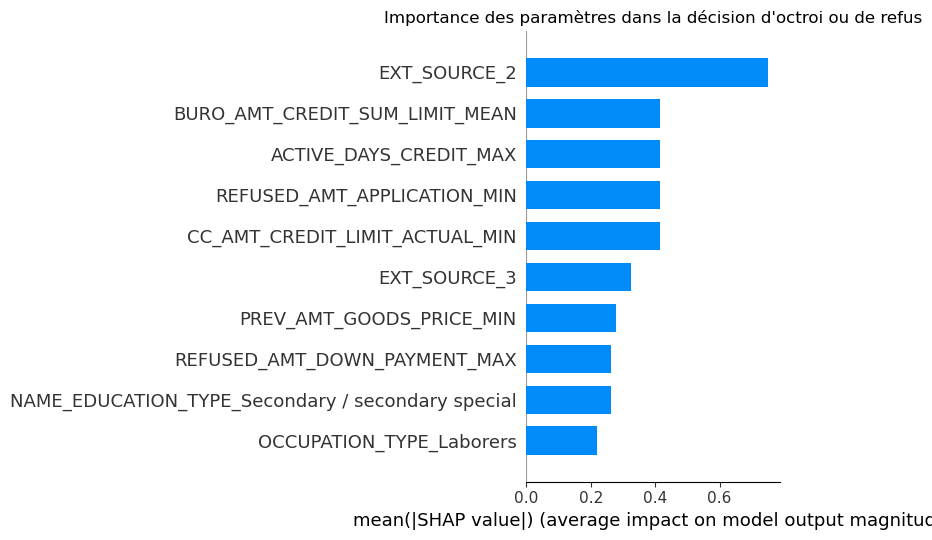

In [277]:
# Summary plot de SHAP
fig, ax = plt.subplots()
plt.title("Importance des paramètres dans la décision d'octroi ou de refus")
explainer = shap.TreeExplainer(loaded_model)
shap_values = explainer.shap_values(client_to_explain)  # Calcul des valeurs de SHAP pour le client sélectionné
shap.summary_plot(shap_values, client_to_explain, plot_type="bar",max_display=feat_number, color_bar=False)

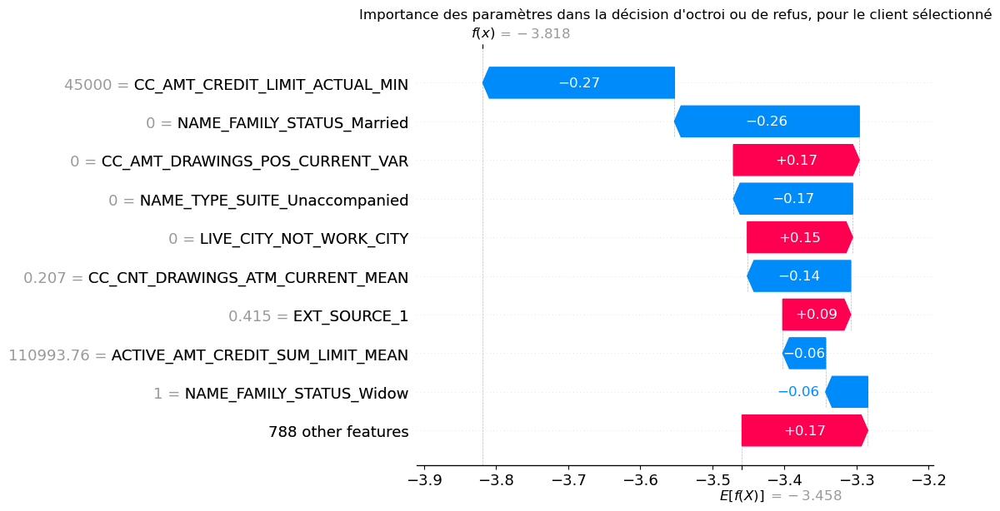

In [279]:
# Waterfall plot de SHAP
fig, ax = plt.subplots()
plt.title("Importance des paramètres dans la décision d'octroi ou de refus, pour le client sélectionné")

explainer = shap.Explainer(loaded_model, test_df_imputed)
# compute SHAP values
shap_values = explainer(test_df_imputed)

#shap.summary_plot(shap_values, client_to_explain, plot_type="bar",max_display=feat_number, color_bar=False)
shap.plots.waterfall(shap_values[index_selected], max_display=feat_number)


## Partie 5 :  Déploiement  <a class="anchor" id="partie5"></a>

### Signature d'un modèle

Afin de garantir que les données d'entrée d'un modèle sont conformes à ce qui est attendu, les modèles MLflow peuvent inclure des metadatas décrivant les entrées et sorties :
- Model Signature - description des entrées et sorties du modèle
- Model Input Example - exemple d'une entrée valide

La signature du modèle permet de renseigner le nom des colonnes et leurs types afin de vérifier si ils sont similaires lors de la prédiction.

[Documentation](https://mlflow.org/docs/latest/models.html#model-signature-and-input-example)

In [ ]:
# fonction infer_signature afin d'extraire la signature à partir des données d'entrée et de sortie.
signature = infer_signature(X_train, y_train)

### Sauvegarde du modèle
On vérifie qu'un répertoire correspondant au modèle vient bien d'être généré avec les fichiers qu'il doit contenir :
*  Fichier du modèle : le modèle lui-même sauvegardé. Le fichier contient le modèle scikit-learn entraîné, prêt à être chargé et utilisé pour faire des prédictions.
* Métadonnées du modèle : Un fichier MLmodel créé pour stocker les métadonnées du modèle, telles que le nom du modèle, la version, les dépendances Python, les paramètres utilisés lors de l'entraînement du modèle, et d'autres informations importantes sur le modèle. Ce fichier est utilisé par MLflow pour charger et gérer les modèles sauvegardés.
* Autres fichier contenant les requirements, dépendances ...

In [ ]:
# Sauvegarde du modèle à l'aide de la fonction save_model en précisant la signature.
mlflow.sklearn.save_model(my_xgboost_classif, 'mlflow_model', signature=signature)

MLflow UI : The Tracking UI lets you visualize, search and compare runs, as well as download run artifacts or metadata for analysis in other tools. 

`mlflow server --backend-store-uri file:///Users/lea/Documents/PROJET7/mlruns`

Réponse du Terminal : `Serving on http://127.0.0.1:5000`

### Déploiement d'une API FAST API

* Création d'un fichier `prediction_app.py` permettant : fichier dans lequel on crée et configure notre objet FastAPI, ainsi que nous définissons les endpoints (points de terminaison) pour notre API. 
* Installation de FastAPI et de uvicorn : uvicorn est un serveur ASGI (Asynchronous Server Gateway Interface) utilisé pour exécuter des applications web asynchrones en Python, notamment avec le framework FastAPI.

In [ ]:
!pip install fastapi
!pip install uvicorn

* Commande pour éxécuer le fichier afin de lancer l'application FastAPI et déployer notre API de prédiction
    * `uvicorn prediction_app:app --host 127.0.0.1 --port 8000`
    * OU
    * `uvicorn prediction_app:app --reload --host 127.0.0.1 --port 8000` ( en mode de rechargement automatique pour faciliter le développement)
* Cela lancera l'application FastAPI sur `http://localhost:8000`
* On peut utiliser cette interface (Interactive API docs) : http://127.0.0.1:8000/docs

### Configuration du tableau de bord Streamlit

* Nous allons maintenant connecter à l'API FastAPI un tableau de bord Streamlit, implémenté avec la librairie [Streamlit](https://www.streamlit.io/).

    * Le fichier `dashboard.py` contient le descriptif de l'interface et les fonctions permettant d'envoyer des requêtes à l'API.

* Pour lancer Streamlit, avec le terminal, depuis le répertoire du projet, avec la commande :`streamlit run dashboard.py`

* Le tableau de bord s'affiche dans un nouvel onglet avec l'adresse : `http://localhost:8501/`

### Déploiement Heroku

* Création du fichier `requirements.txt`qui contient les dépendances du projet : 
    * Installer pipreqs : `pip install pipreqs`
    * Dans le dossier du projet, lancer la commande `pip pipreqs`: cela va créer automatiquement le fichier des dépendences.
    
* Création du fichier `Procfile` (sans extension ! ) pour spécifier les commandes qui sont à exécuter par Heroku app au démarrage.Ce fichier `Procfile` doit être situé à la racine du projet pour que Heroku le reconnaisse.

## Partie 6 :  Analyse du Data Drift avec Evidently AI <a class="anchor" id="partie6"></a>
* L'objectif est de tester l’utilisation de la librairie evidently pour détecter dans le futur du Data Drift en production. 
* Le data drift (ou dérive de données) se produit lorsqu'il y a des changements de  distribution entre les données utilisées en entrée d’un modèle de ML et les données qui ont été utilisées pour entraîner ce modèle (changements liés à diverses raisons :  évolution des tendances, changements dans les comportements, erreurs dans les données d'entrée…). Si les données sur lesquelles le modèle a été entraîné le reflète plus les données en production, le data drift peut impacter la performance du modèle. Il est donc important de surveiller régulièrement les données d'entrée et de ré-entraîner le modèle si nécessaire afin de maintenir sa précision et sa fiabilité au fil du temps.

* Nous prendrons comme hypothèse que le dataset “application_train” représente les données pour la modélisation et le dataset “application_test” représente les données de nouveaux clients une fois le modèle en production. 

* L’analyse à l’aide d’evidently nous permettra de détecter éventuellement du Data Drift sur les principales features, entre les data d’entraînement et les data de production, au travers du tableau HTML de rapport issu du traitement.

In [262]:
# Data de "reference" utilisée pour l'entraînement du modèle
app_train_df = pd.read_csv('application_train.csv')
# "current_data", données en production, correspondant à des nouveaux clients
app_test_df = pd.read_csv('application_test.csv')

feats = [f for f in app_train_df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
app_train_df=app_train_df.filter(feats)
app_test_df=app_test_df.filter(feats)

In [263]:
# Column mapping 
column_mapping = ColumnMapping()
column_mapping.numerical_features = app_train_df.select_dtypes(exclude=['object']).columns.tolist() #list of numerical features
column_mapping.categorical_features = app_train_df.select_dtypes(include=['object']).columns.tolist() # list of categ features

In [264]:
with timer('Création du rapport de dataDrift') :
    report = Report(metrics=[DataDriftPreset(), ]) # choix du rapport "DataDriftPreset"
    report.run(column_mapping = column_mapping, reference_data=app_train_df, current_data=app_test_df) # Création du rapport
    report.save_html("data_drift_analysis.html") # sauvegarde du rapport au format html( pas possible de l'affiche dans le notebook sous windows)

Création du rapport de dataDrift - done in 1415s


Sous windows, il n'est pas possible d'afficher le rapport dans le notebook. Il est sauvegardé du rapport au format html dans le repertoire du projet.

## PROGRAMME COMPLET

In [ ]:
####################################################
# MON PROGRAMME COMPLET DE PREPARATION DES DONNEES #
###################################################
def main(debug = False):
    # Feature engineeging
    with timer("Feature engineering"):
        feat_engin_data=feature_engineering(num_rows=None)
        feat_engin_data.to_csv("feat_engin_data.csv")
    # preprocessing : imputation des valeurs manquantes, ttt du déséquilibre de classe avec SMOTE
    with timer("préprocessing"):
        X_smote, y_smote, test_df_imputed=preprocessing(feat_engin_data.sample(500))
        test_df_imputed.to_csv("test_df_imputed_file.csv")